<a href="https://colab.research.google.com/github/raypaver/googleLMMM/blob/main/pymc_fullMMM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google LightweightMMM
https://github.com/google/lightweight_mmm

In [1]:
pip install pymc-marketing

In [2]:

import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns

from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [3]:
seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

# date range
min_date = pd.to_datetime("2018-04-01")
max_date = pd.to_datetime("2021-09-01")

df = pd.DataFrame(
    data={"date_week": pd.date_range(start=min_date, end=max_date, freq="W-MON")}
).assign(
    year=lambda x: x["date_week"].dt.year,
    month=lambda x: x["date_week"].dt.month,
    dayofyear=lambda x: x["date_week"].dt.dayofyear,
)

n = df.shape[0]
print(f"Number of observations: {n}")

Number of observations: 179


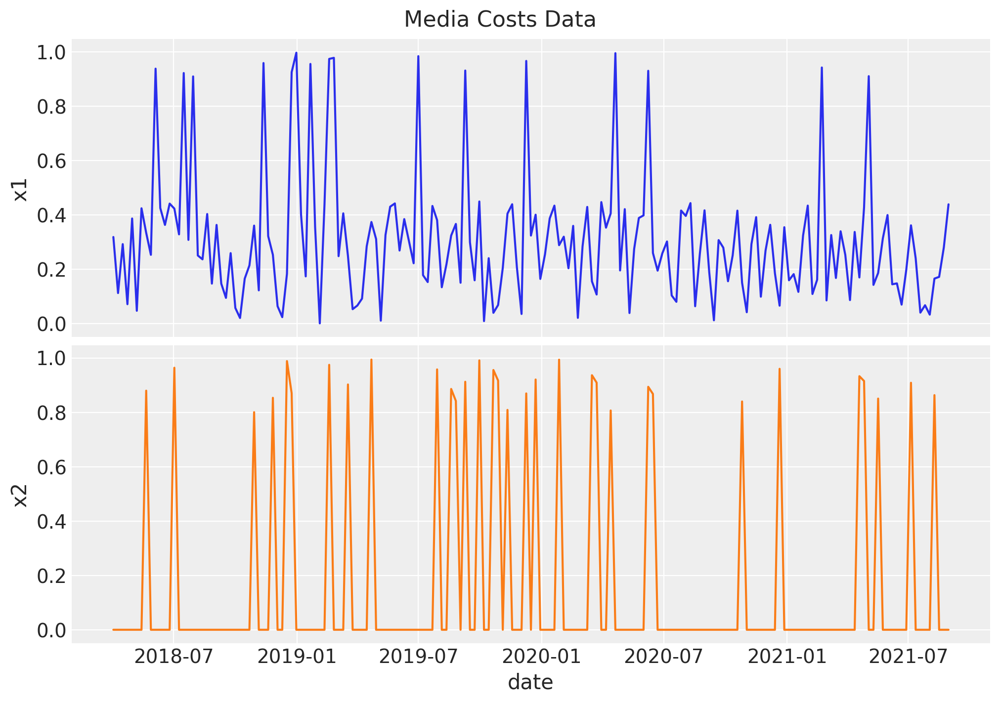

In [4]:
# media data
x1 = rng.uniform(low=0.0, high=1.0, size=n)
df["x1"] = np.where(x1 > 0.9, x1, x1 / 2)

x2 = rng.uniform(low=0.0, high=1.0, size=n)
df["x2"] = np.where(x2 > 0.8, x2, 0)


fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(10, 7), sharex=True, sharey=True, layout="constrained"
)
sns.lineplot(x="date_week", y="x1", data=df, color="C0", ax=ax[0])
sns.lineplot(x="date_week", y="x2", data=df, color="C1", ax=ax[1])
ax[1].set(xlabel="date")
fig.suptitle("Media Costs Data", fontsize=16);

In [5]:
# apply geometric adstock transformation
alpha1: float = 0.4
alpha2: float = 0.2

df["x1_adstock"] = (
    geometric_adstock(x=df["x1"].to_numpy(), alpha=alpha1, l_max=8, normalize=True)
    .eval()
    .flatten()
)

df["x2_adstock"] = (
    geometric_adstock(x=df["x2"].to_numpy(), alpha=alpha2, l_max=8, normalize=True)
    .eval()
    .flatten()
)

In [6]:
# apply saturation transformation
lam1: float = 4.0
lam2: float = 3.0

df["x1_adstock_saturated"] = logistic_saturation(
    x=df["x1_adstock"].to_numpy(), lam=lam1
).eval()

df["x2_adstock_saturated"] = logistic_saturation(
    x=df["x2_adstock"].to_numpy(), lam=lam2
).eval()

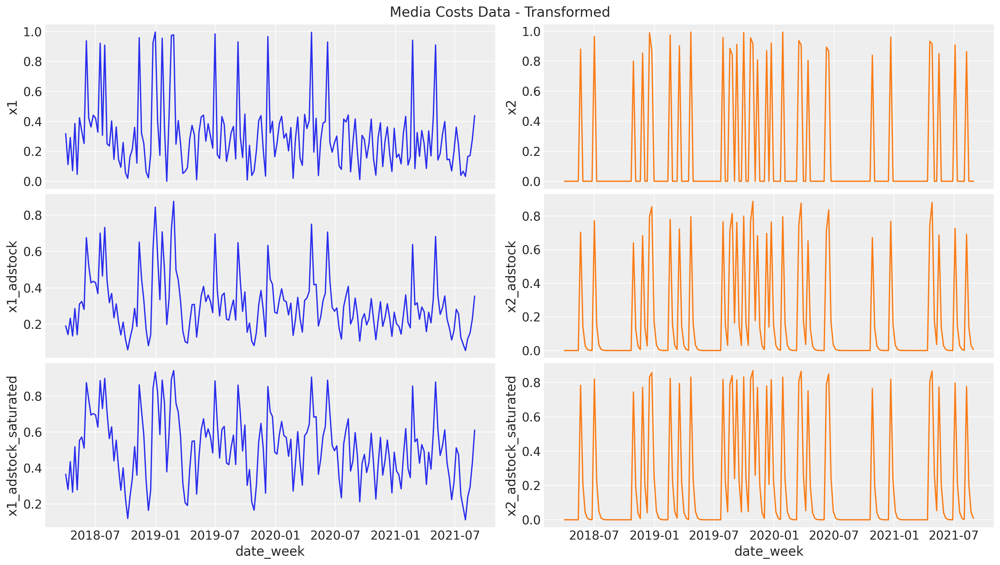

In [7]:
fig, ax = plt.subplots(
    nrows=3, ncols=2, figsize=(16, 9), sharex=True, sharey=False, layout="constrained"
)
sns.lineplot(x="date_week", y="x1", data=df, color="C0", ax=ax[0, 0])
sns.lineplot(x="date_week", y="x2", data=df, color="C1", ax=ax[0, 1])
sns.lineplot(x="date_week", y="x1_adstock", data=df, color="C0", ax=ax[1, 0])
sns.lineplot(x="date_week", y="x2_adstock", data=df, color="C1", ax=ax[1, 1])
sns.lineplot(x="date_week", y="x1_adstock_saturated", data=df, color="C0", ax=ax[2, 0])
sns.lineplot(x="date_week", y="x2_adstock_saturated", data=df, color="C1", ax=ax[2, 1])
fig.suptitle("Media Costs Data - Transformed", fontsize=16);

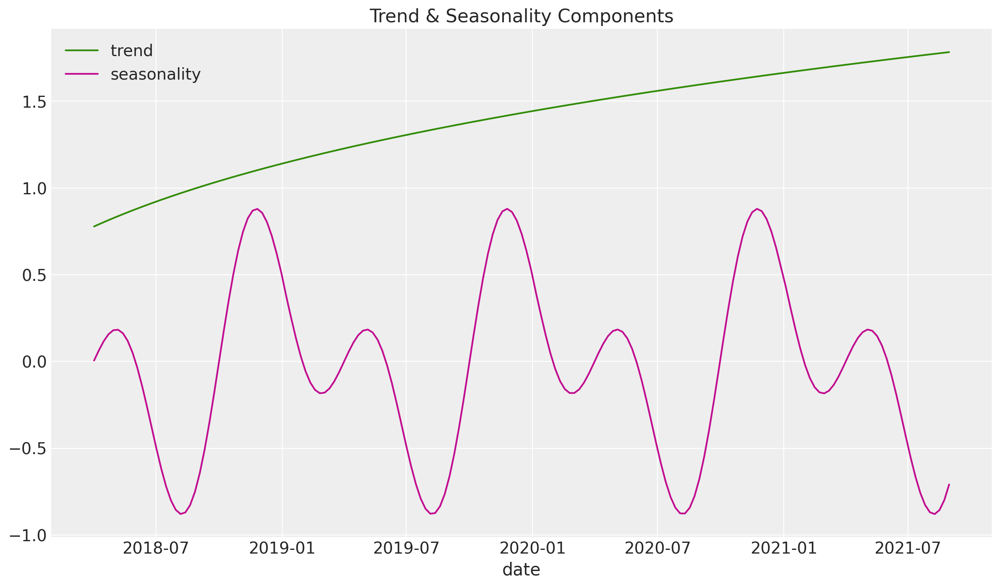

In [8]:
df["trend"] = (np.linspace(start=0.0, stop=50, num=n) + 10) ** (1 / 4) - 1

df["cs"] = -np.sin(2 * 2 * np.pi * df["dayofyear"] / 365.5)
df["cc"] = np.cos(1 * 2 * np.pi * df["dayofyear"] / 365.5)
df["seasonality"] = 0.5 * (df["cs"] + df["cc"])

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="trend", color="C2", label="trend", data=df, ax=ax)
sns.lineplot(
    x="date_week", y="seasonality", color="C3", label="seasonality", data=df, ax=ax
)
ax.legend(loc="upper left")
ax.set(title="Trend & Seasonality Components", xlabel="date", ylabel=None);

In [9]:
df["event_1"] = (df["date_week"] == "2019-05-13").astype(float)
df["event_2"] = (df["date_week"] == "2020-09-14").astype(float)

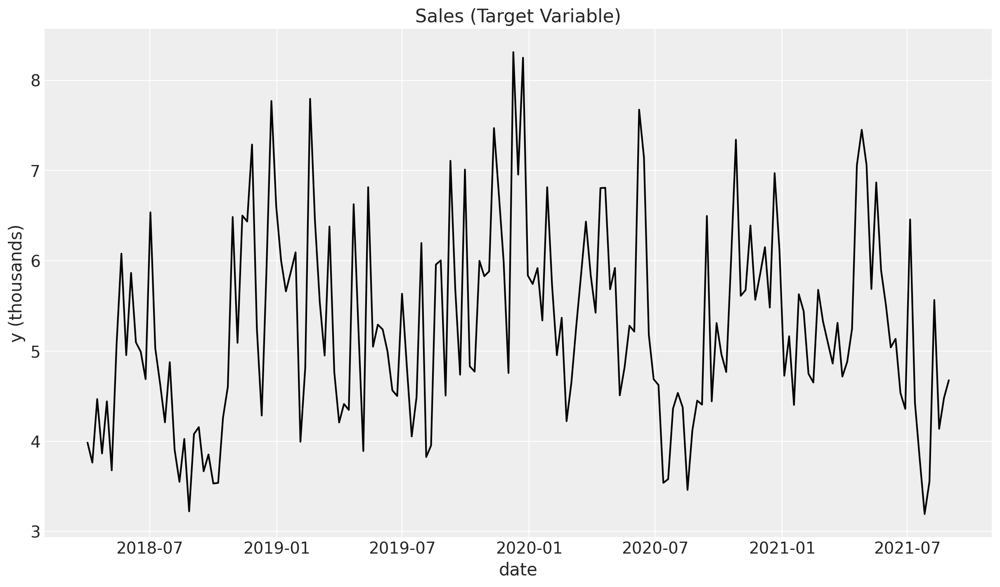

In [10]:
df["intercept"] = 2.0
df["epsilon"] = rng.normal(loc=0.0, scale=0.25, size=n)

amplitude = 1
beta_1 = 3.0
beta_2 = 2.0
betas = [beta_1, beta_2]


df["y"] = amplitude * (
    df["intercept"]
    + df["trend"]
    + df["seasonality"]
    + 1.5 * df["event_1"]
    + 2.5 * df["event_2"]
    + beta_1 * df["x1_adstock_saturated"]
    + beta_2 * df["x2_adstock_saturated"]
    + df["epsilon"]
)

fig, ax = plt.subplots()
sns.lineplot(x="date_week", y="y", color="black", data=df, ax=ax)
ax.set(title="Sales (Target Variable)", xlabel="date", ylabel="y (thousands)");

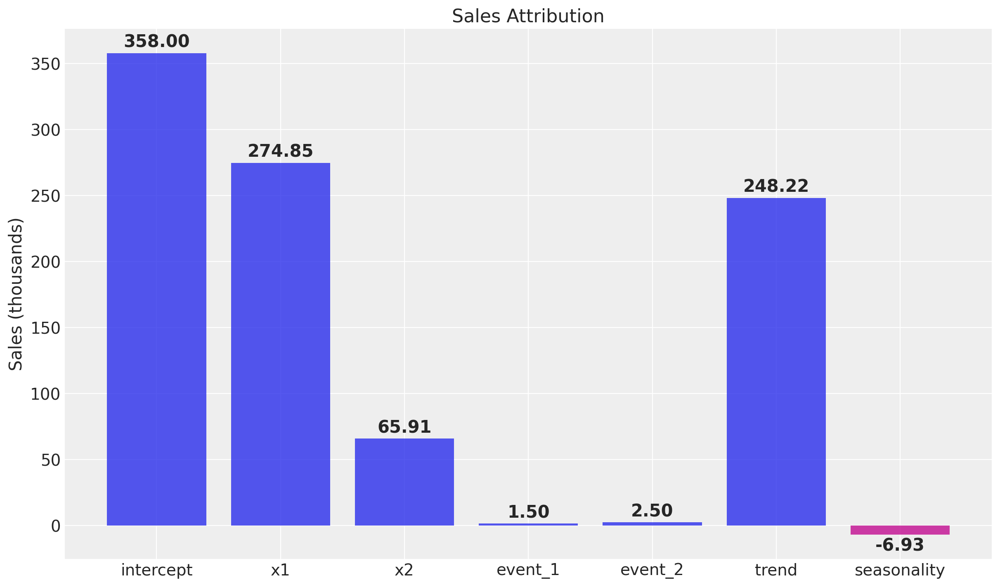

In [11]:
fig, ax = plt.subplots()

contributions = [
    df["intercept"].sum(),
    (beta_1 * df["x1_adstock_saturated"]).sum(),
    (beta_2 * df["x2_adstock_saturated"]).sum(),
    1.5 * df["event_1"].sum(),
    2.5 * df["event_2"].sum(),
    df["trend"].sum(),
    df["seasonality"].sum(),
]

ax.bar(
    ["intercept", "x1", "x2", "event_1", "event_2", "trend", "seasonality"],
    contributions,
    color=["C0" if x >= 0 else "C3" for x in contributions],
    alpha=0.8,
)
ax.bar_label(
    ax.containers[0],
    fmt="{:,.2f}",
    label_type="edge",
    padding=2,
    fontsize=15,
    fontweight="bold",
)
ax.set(title="Sales Attribution", ylabel="Sales (thousands)");

In [12]:
contribution_share_x1: float = (beta_1 * df["x1_adstock_saturated"]).sum() / (
    beta_1 * df["x1_adstock_saturated"] + beta_2 * df["x2_adstock_saturated"]
).sum()

contribution_share_x2: float = (beta_2 * df["x2_adstock_saturated"]).sum() / (
    beta_1 * df["x1_adstock_saturated"] + beta_2 * df["x2_adstock_saturated"]
).sum()

print(f"Contribution Share of x1: {contribution_share_x1:.2f}")
print(f"Contribution Share of x2: {contribution_share_x2:.2f}")

Contribution Share of x1: 0.81
Contribution Share of x2: 0.19


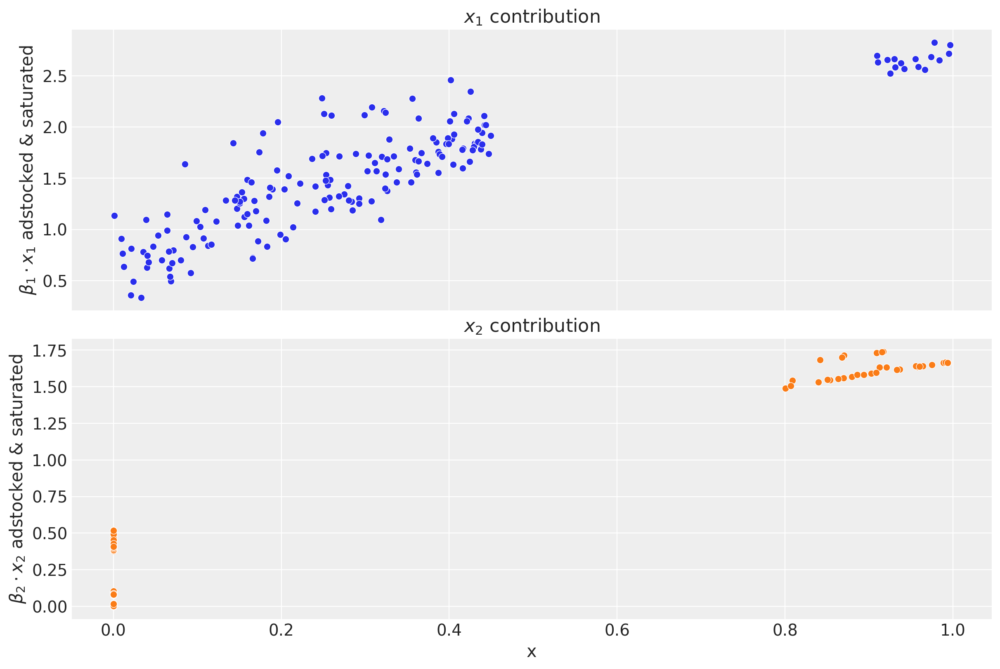

In [13]:
fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(12, 8), sharex=True, sharey=False, layout="constrained"
)

for i, x in enumerate(["x1", "x2"]):
    sns.scatterplot(
        x=df[x],
        y=amplitude * betas[i] * df[f"{x}_adstock_saturated"],
        color=f"C{i}",
        ax=ax[i],
    )
    ax[i].set(
        title=f"$x_{i + 1}$ contribution",
        ylabel=f"$\\beta_{i + 1} \\cdot x_{i + 1}$ adstocked & saturated",
        xlabel="x",
    )

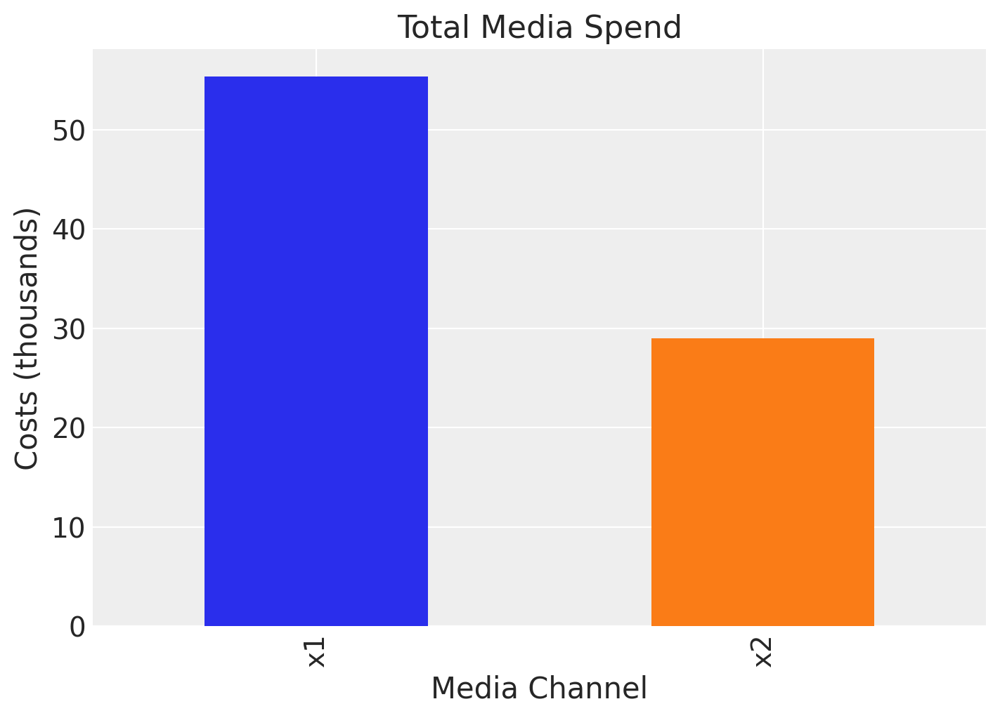

In [14]:
fig, ax = plt.subplots(figsize=(7, 5))
df[["x1", "x2"]].sum().plot(kind="bar", color=["C0", "C1"], ax=ax)
ax.set(title="Total Media Spend", xlabel="Media Channel", ylabel="Costs (thousands)");

In [15]:
roas_1 = (amplitude * beta_1 * df["x1_adstock_saturated"]).sum() / df["x1"].sum()
roas_2 = (amplitude * beta_2 * df["x2_adstock_saturated"]).sum() / df["x2"].sum()

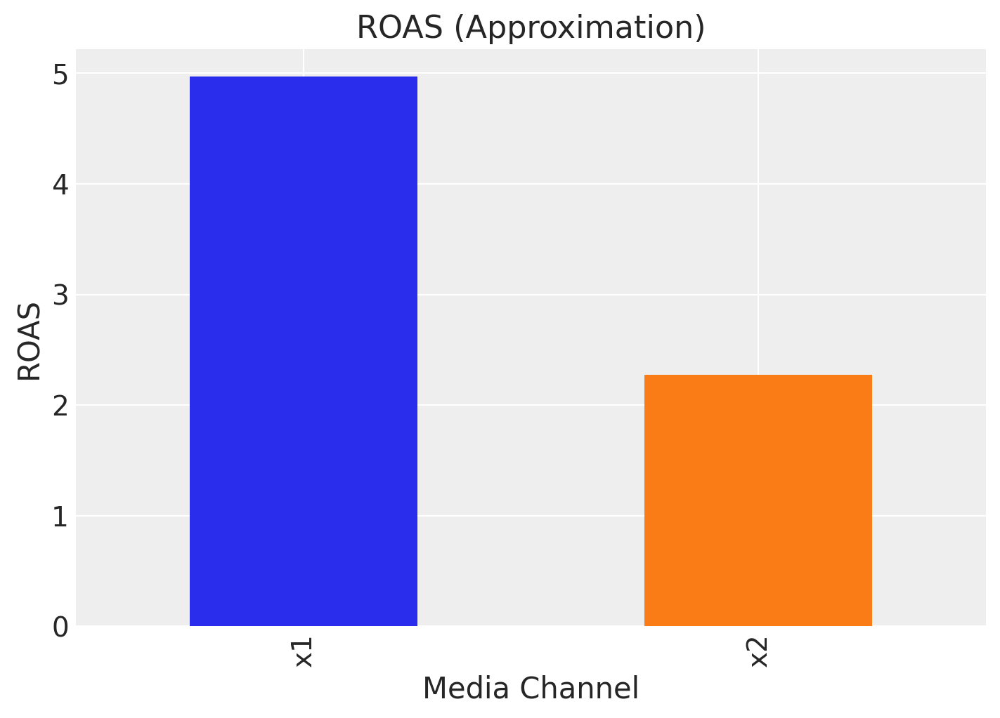

In [16]:
fig, ax = plt.subplots(figsize=(7, 5))
(
    pd.Series(data=[roas_1, roas_2], index=["x1", "x2"]).plot(
        kind="bar", color=["C0", "C1"]
    )
)

ax.set(title="ROAS (Approximation)", xlabel="Media Channel", ylabel="ROAS");

In [17]:
columns_to_keep = [
    "date_week",
    "y",
    "x1",
    "x2",
    "event_1",
    "event_2",
    "dayofyear",
]

data = df[columns_to_keep].copy()

data.head()

,date_week,y,x1,x2,event_1,event_2,dayofyear
0,2018-04-02,3.984662,0.318580,0.0,0.0,0.0,92
1,2018-04-09,3.762872,0.112388,0.0,0.0,0.0,99
2,2018-04-16,4.466967,0.292400,0.0,0.0,0.0,106
3,2018-04-23,3.864219,0.071399,0.0,0.0,0.0,113
4,2018-04-30,4.441625,0.386745,0.0,0.0,0.0,120


In [18]:
# trend feature
data["t"] = range(n)

data.head()

,date_week,y,x1,x2,event_1,event_2,dayofyear,t
0,2018-04-02,3.984662,0.318580,0.0,0.0,0.0,92,0
1,2018-04-09,3.762872,0.112388,0.0,0.0,0.0,99,1
2,2018-04-16,4.466967,0.292400,0.0,0.0,0.0,106,2
3,2018-04-23,3.864219,0.071399,0.0,0.0,0.0,113,3
4,2018-04-30,4.441625,0.386745,0.0,0.0,0.0,120,4


In [19]:
total_spend_per_channel = data[["x1", "x2"]].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()

spend_share

,0
x1,0.65632
x2,0.34368


In [20]:
n_channels = 2

prior_sigma = n_channels * spend_share.to_numpy()

prior_sigma.tolist()

[1.3126390269400678, 0.687360973059932]

In [21]:
X = data.drop("y", axis=1)
y = data["y"]

In [22]:
dummy_model = MMM(
    date_column="",
    channel_columns=[""],
    adstock=GeometricAdstock(l_max=4),
    saturation=LogisticSaturation(),
)
dummy_model.default_model_config

{'intercept': Prior("Normal", mu=0, sigma=2),
 'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)),
 'gamma_control': Prior("Normal", mu=0, sigma=2, dims="control"),
 'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1, dims="channel"),
 'saturation_beta': Prior("HalfNormal", sigma=2, dims="channel")}

In [23]:
my_model_config = {
    "intercept": {"dist": "Normal", "kwargs": {"mu": 0, "sigma": 0.5}},
    "saturation_beta": {
        "dist": "HalfNormal",
        "kwargs": {"sigma": prior_sigma},
    },
    "gamma_control": {
        "dist": "Normal",
        "kwargs": {"mu": 0, "sigma": 0.05},
    },
    "gamma_fourier": {
        "dist": "Laplace",
        "kwargs": {"mu": 0, "b": 0.2},
    },
    "likelihood": {
        "dist": "Normal",
        "kwargs": {
            "sigma": {"dist": "Exponential", "kwargs": {"lam": 1 / 10}}
            # Also possible define sigma as:
            # {'sigma': 5}
        },
    },
}

In [24]:
my_sampler_config = {"progressbar": True}

In [25]:
mmm = MMM(
    model_config=my_model_config,
    sampler_config=my_sampler_config,
    date_column="date_week",
    adstock=GeometricAdstock(l_max=8),
    saturation=LogisticSaturation(),
    channel_columns=["x1", "x2"],
    control_columns=[
        "event_1",
        "event_2",
        "t",
    ],
    yearly_seasonality=2,
)

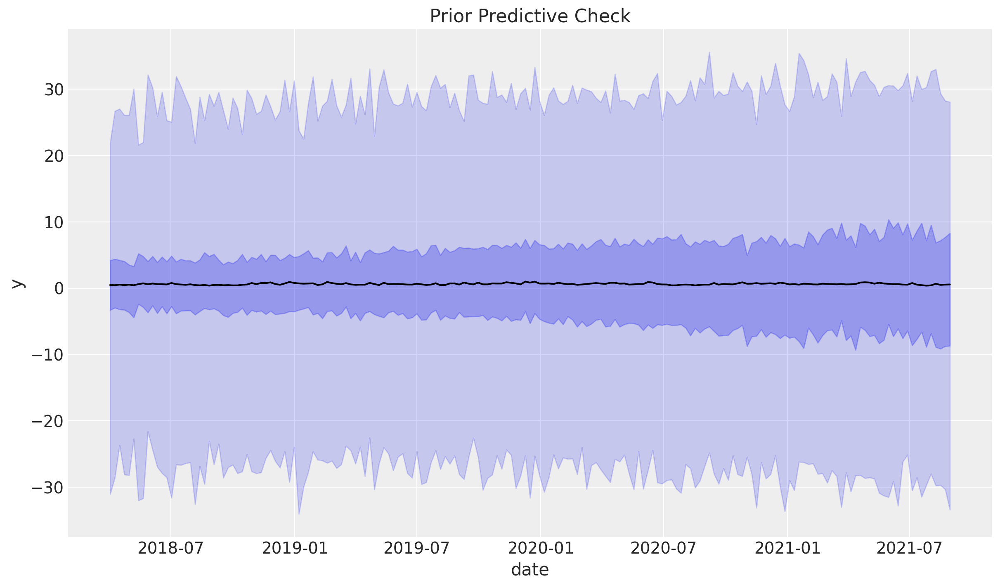

In [26]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X, y, samples=2_000)

mmm.plot_prior_predictive();

In [27]:
mmm.fit(X=X, y=y, target_accept=0.85, chains=4, random_seed=rng)

Output()

Output()

Output()

Output()

ERROR:pymc.stats.convergence:There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

In [28]:
type(mmm.model)

pymc.model.core.Model

In [30]:
print(f"Model was train using the {mmm.saturation.__class__.__name__} function")
print(f"and the {mmm.adstock.__class__.__name__} function")

Model was train using the LogisticSaturation function
and the GeometricAdstock function


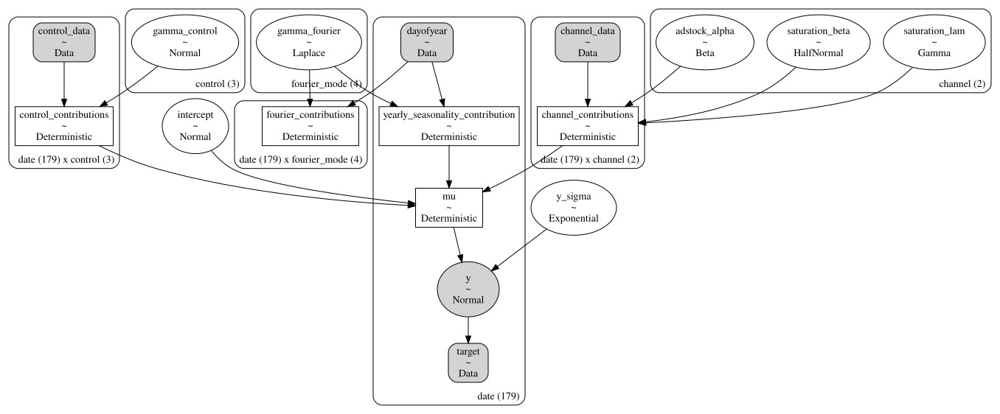

In [31]:
pm.model_to_graphviz(model=mmm.model)


In [32]:
# Number of diverging samples
mmm.idata["sample_stats"]["diverging"].sum().item()

3

In [33]:
mmm.fit_result

<xarray.Dataset> Size: 63MB
Dimensions:                          (chain: 4, draw: 1000, channel: 2,
                                      date: 179, control: 3, fourier_mode: 4)
Coordinates:
  * chain                            (chain) int64 32B 0 1 2 3
  * draw                             (draw) int64 8kB 0 1 2 3 ... 997 998 999
  * channel                          (channel) <U2 16B 'x1' 'x2'
  * date                             (date) datetime64[ns] 1kB 2018-04-02 ......
  * control                          (control) <U7 84B 'event_1' 'event_2' 't'
  * fourier_mode                     (fourier_mode) <U5 80B 'sin_1' ... 'cos_2'
Data variables:
    adstock_alpha                    (chain, draw, channel) float64 64kB 0.37...
    channel_contributions            (chain, draw, date, channel) float64 11MB ...
    control_contributions            (chain, draw, date, control) float64 17MB ...
    fourier_contributions            (chain, draw, date, fourier_mode) float64 23MB ...
    gamma_control                    (chain, draw, control) float64 96kB 0.21...
    gamma_fourier                    (chain, draw, fourier_mode) float64 128kB ...
    intercept                        (chain, draw) float64 32kB 0.3818 ... 0....
    mu                               (chain, draw, date) float64 6MB 0.4974 ....
    saturation_beta                  (chain, draw, channel) float64 64kB 0.35...
    saturation_lam                   (chain, draw, channel) float64 64kB 3.26...
    y_sigma                          (chain, draw) float64 32kB 0.03113 ... 0...
    yearly_seasonality_contribution  (chain, draw, date) float64 6MB 0.004138...
Attributes:
    created_at:                 2024-10-29T06:26:00.850117+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1
    sampling_time:              340.231942653656
    tuning_steps:               1000

In [34]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,0.354,0.013,0.328,0.379,0.000,0.000,2153.0,2410.0,1.0
y_sigma,0.031,0.002,0.028,0.035,0.000,0.000,3067.0,2829.0,1.0
saturation_beta[x1],0.363,0.020,0.327,0.402,0.000,0.000,1957.0,1871.0,1.0
saturation_beta[x2],0.271,0.087,0.192,0.399,0.003,0.002,1268.0,1091.0,1.0
saturation_lam[x1],3.958,0.390,3.212,4.675,0.008,0.006,2155.0,1803.0,1.0
saturation_lam[x2],3.133,1.196,0.997,5.291,0.032,0.023,1257.0,1092.0,1.0
adstock_alpha[x1],0.403,0.031,0.345,0.460,0.001,0.000,2648.0,2850.0,1.0
adstock_alpha[x2],0.187,0.041,0.108,0.258,0.001,0.001,2025.0,2007.0,1.0
gamma_control[event_1],0.176,0.028,0.126,0.230,0.000,0.000,4092.0,2822.0,1.0
gamma_control[event_2],0.231,0.028,0.180,0.283,0.000,0.000,4276.0,2848.0,1.0


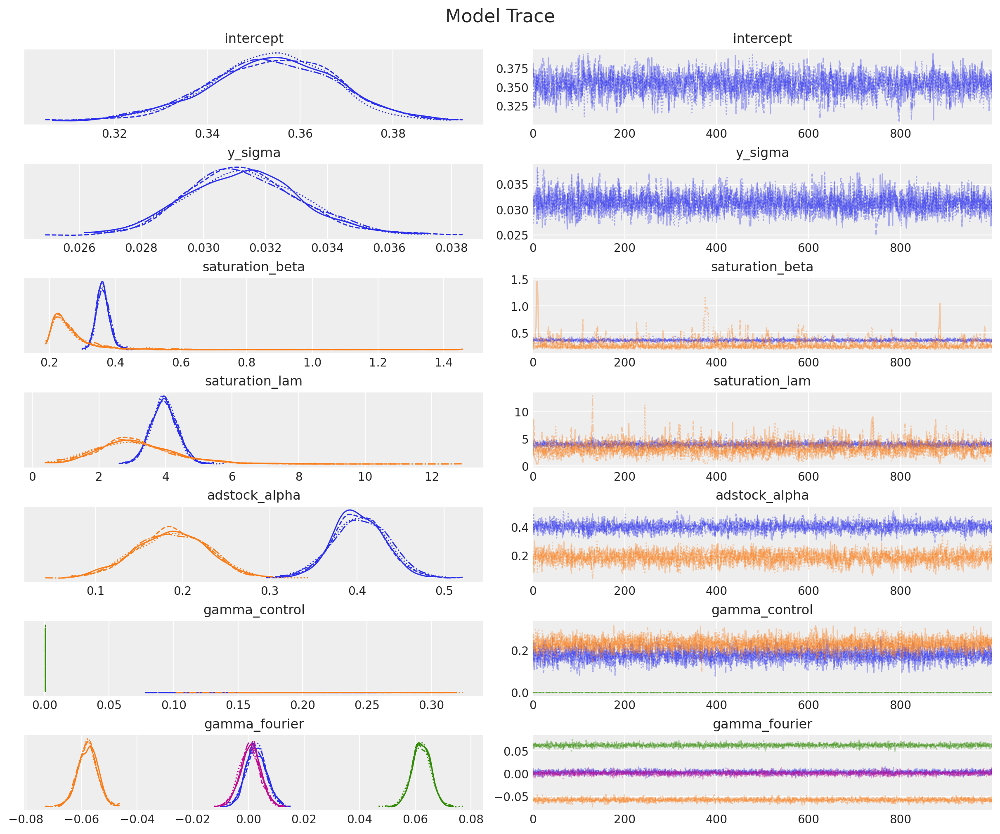

In [35]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

In [36]:
mmm.sample_posterior_predictive(X, extend_idata=True, combined=True)

Output()

<xarray.Dataset> Size: 6MB
Dimensions:  (sample: 4000, date: 179)
Coordinates:
  * date     (date) datetime64[ns] 1kB 2018-04-02 2018-04-09 ... 2021-08-30
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 6MB 3.954 4.156 3.6 ... 4.348 5.142 5.348
Attributes:
    created_at:                 2024-10-29T06:29:27.929665+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

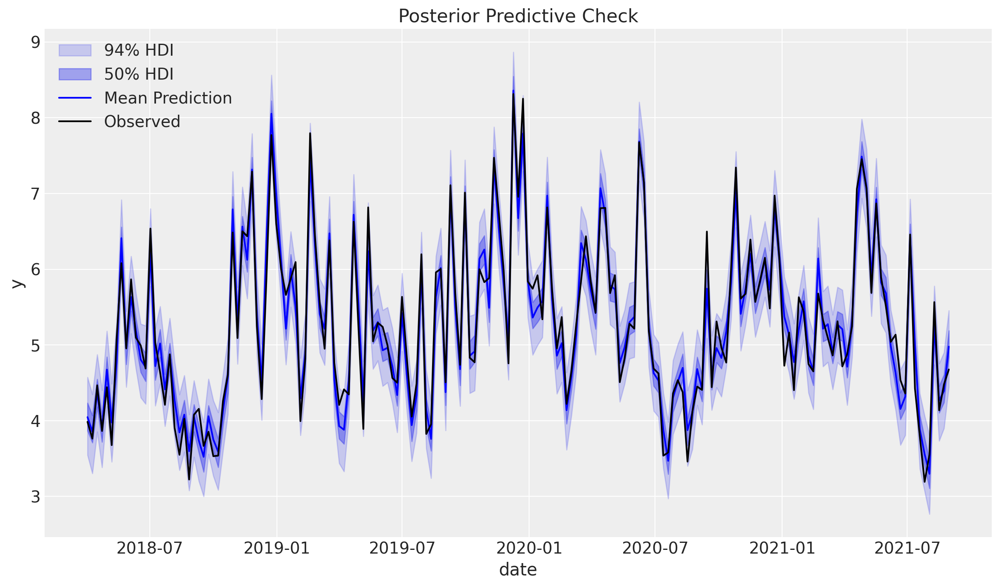

In [37]:
mmm.plot_posterior_predictive(original_scale=True);

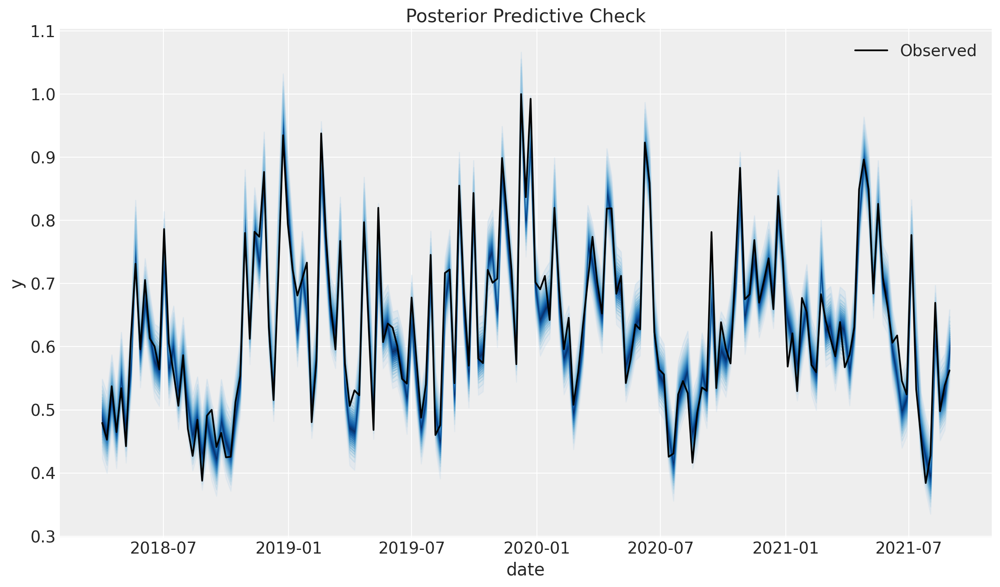

In [38]:
mmm.plot_posterior_predictive(add_hdi=False, add_mean=False, add_gradient=True);

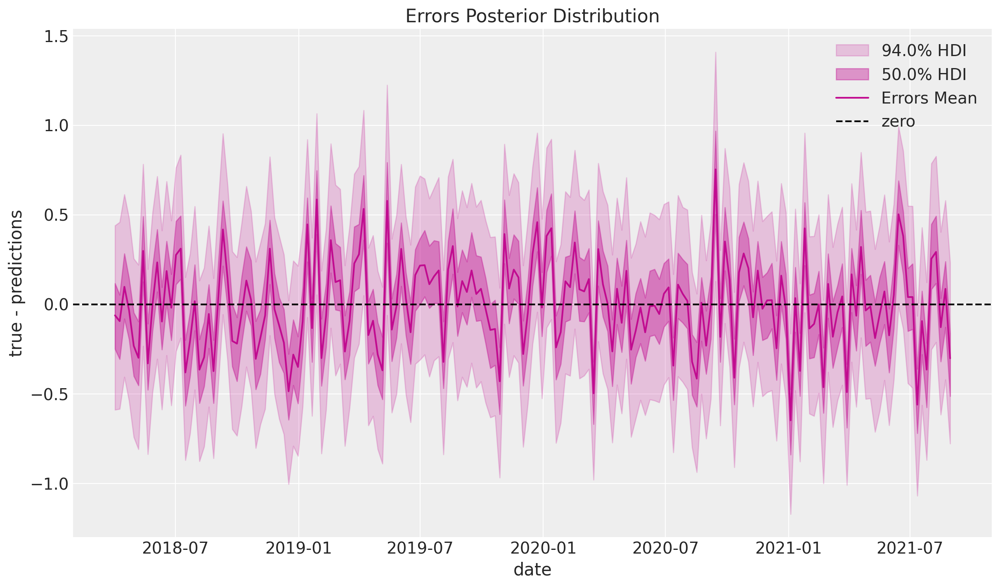

In [39]:
mmm.plot_errors(original_scale=True);

In [40]:
errors = mmm.get_errors(original_scale=True)

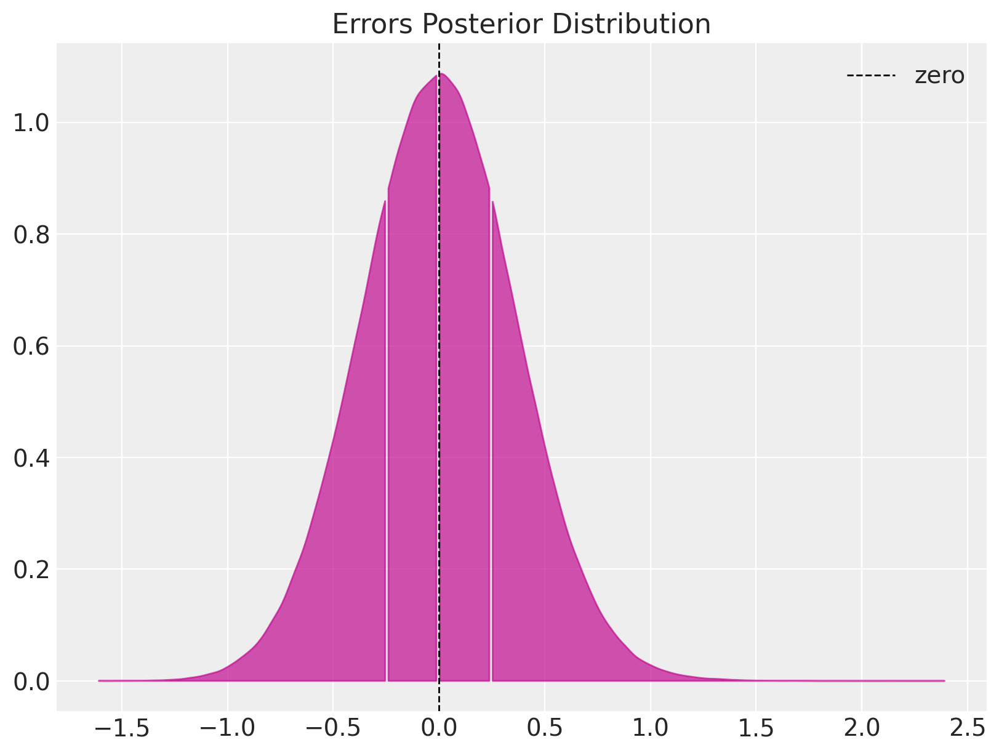

In [41]:
fig, ax = plt.subplots(figsize=(8, 6))
az.plot_dist(
    errors, quantiles=[0.25, 0.5, 0.75], color="C3", fill_kwargs={"alpha": 0.7}, ax=ax
)
ax.axvline(x=0, color="black", linestyle="--", linewidth=1, label="zero")
ax.legend()
ax.set(title="Errors Posterior Distribution");

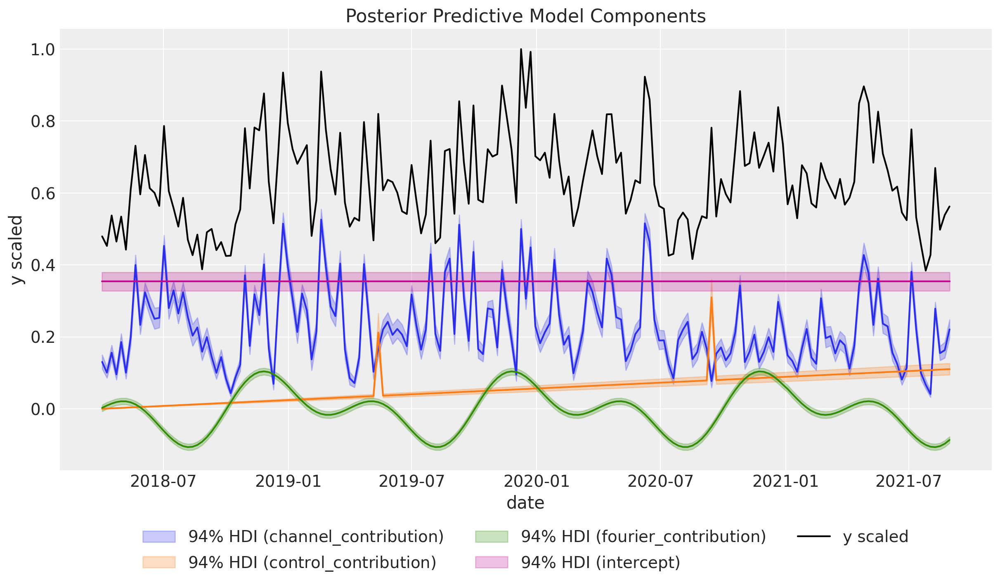

In [42]:
mmm.plot_components_contributions();

In [43]:
mmm.get_target_transformer()

Pipeline(steps=[('scaler', MaxAbsScaler())])

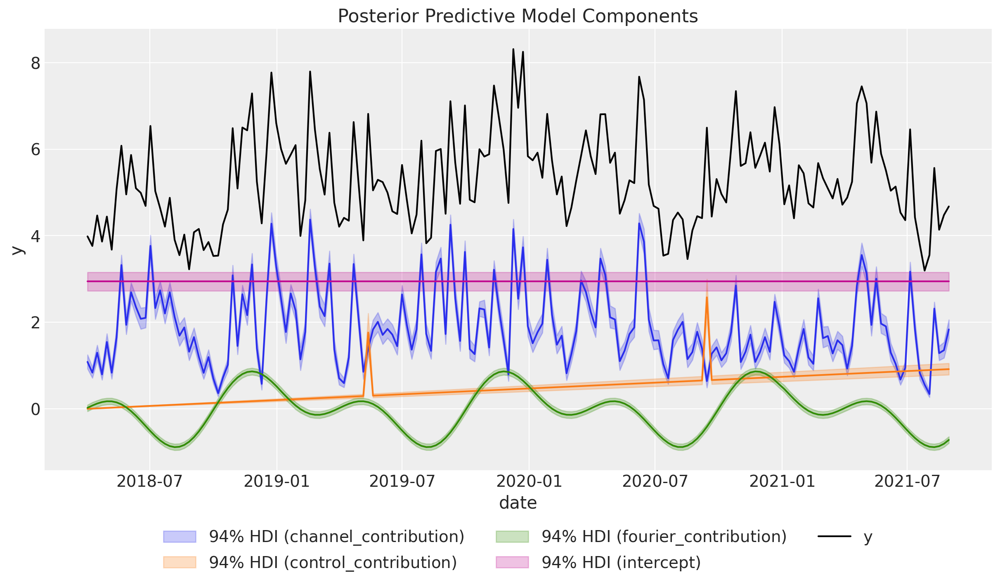

In [44]:
mmm.plot_components_contributions(original_scale=True);

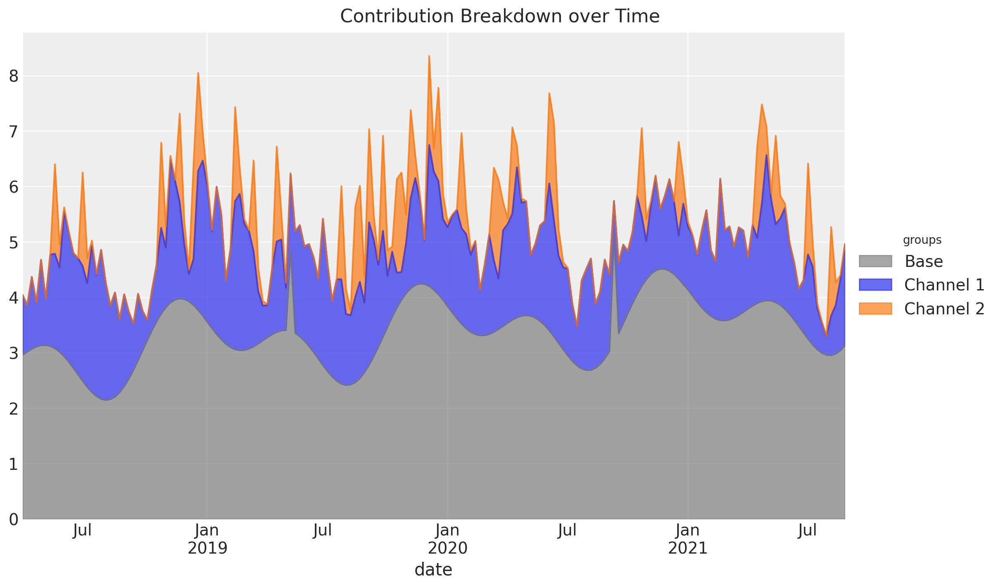

In [45]:
groups = {
    "Base": [
        "intercept",
        "event_1",
        "event_2",
        "t",
        "yearly_seasonality",
    ],
    "Channel 1": ["x1"],
    "Channel 2": ["x2"],
}

fig = mmm.plot_grouped_contribution_breakdown_over_time(
    stack_groups=groups,
    original_scale=True,
    area_kwargs={
        "color": {
            "Channel 1": "C0",
            "Channel 2": "C1",
            "Base": "gray",
            "Seasonality": "black",
        },
        "alpha": 0.7,
    },
)

fig.suptitle("Contribution Breakdown over Time", fontsize=16);

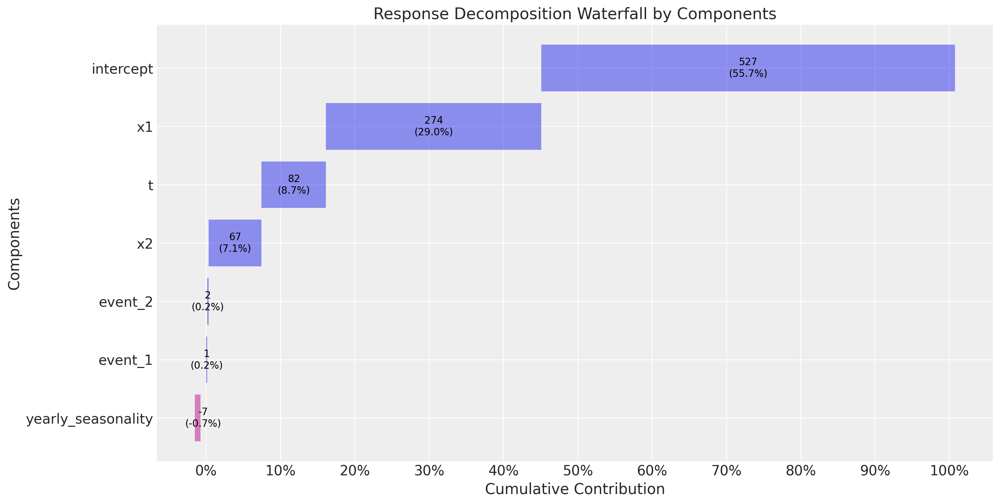

In [46]:
mmm.plot_waterfall_components_decomposition();

In [47]:
get_mean_contributions_over_time_df = mmm.compute_mean_contributions_over_time(
    original_scale=True
)

get_mean_contributions_over_time_df.head()

,x1,x2,event_1,event_2,t,yearly_seasonality,intercept
date,,,,,,,
2018-04-02,1.083690,0.0,0.0,0.0,0.000000,0.022542,2.941835
2018-04-09,0.834830,0.0,0.0,0.0,0.005145,0.074848,2.941835
2018-04-16,1.296172,0.0,0.0,0.0,0.010289,0.120853,2.941835
2018-04-23,0.794744,0.0,0.0,0.0,0.015434,0.155241,2.941835
2018-04-30,1.543017,0.0,0.0,0.0,0.020579,0.173431,2.941835


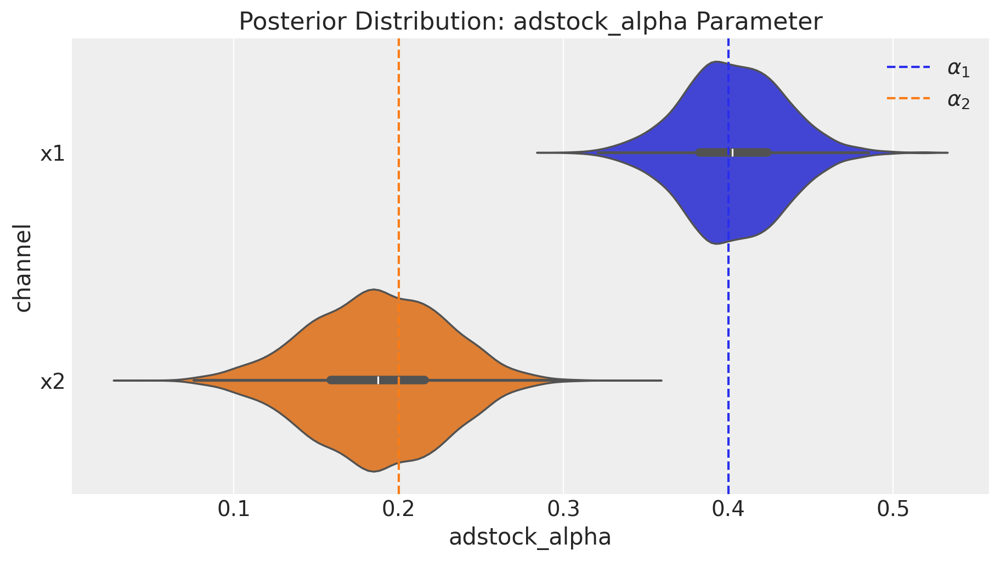

In [48]:
fig = mmm.plot_channel_parameter(param_name="adstock_alpha", figsize=(9, 5))
ax = fig.axes[0]
ax.axvline(x=alpha1, color="C0", linestyle="--", label=r"$\alpha_1$")
ax.axvline(x=alpha2, color="C1", linestyle="--", label=r"$\alpha_2$")
ax.legend(loc="upper right");

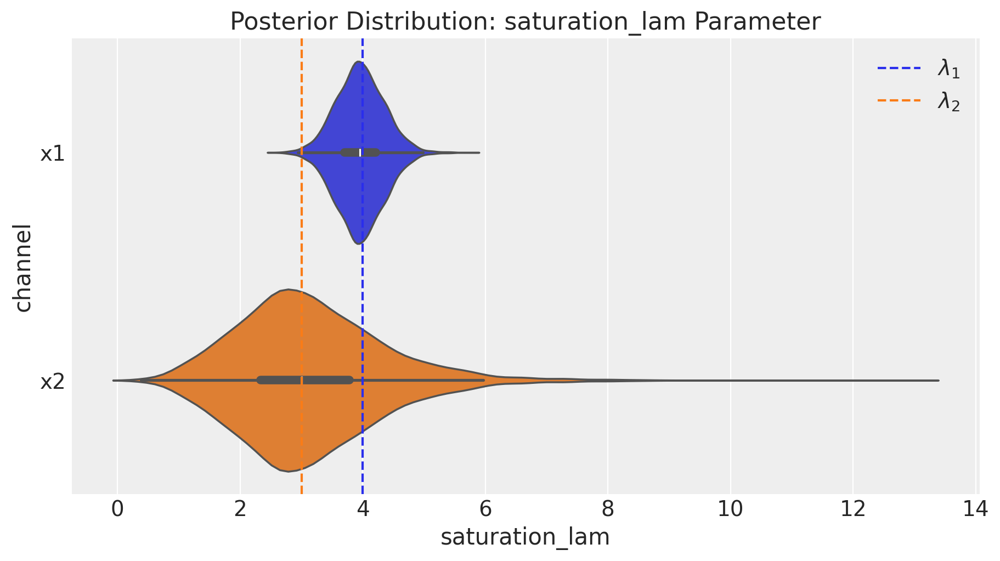

In [49]:
fig = mmm.plot_channel_parameter(param_name="saturation_lam", figsize=(9, 5))
ax = fig.axes[0]
ax.axvline(x=lam1, color="C0", linestyle="--", label=r"$\lambda_1$")
ax.axvline(x=lam2, color="C1", linestyle="--", label=r"$\lambda_2$")
ax.legend(loc="upper right");

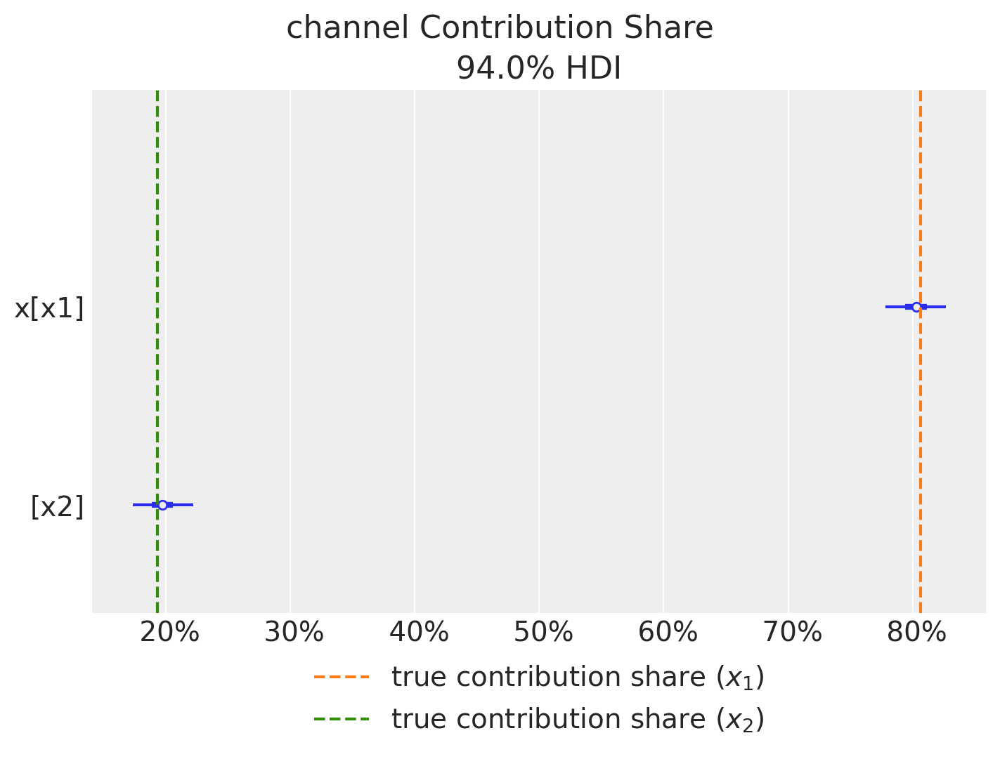

In [50]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(7, 5))
ax = fig.axes[0]
ax.axvline(
    x=contribution_share_x1,
    color="C1",
    linestyle="--",
    label="true contribution share ($x_1$)",
)
ax.axvline(
    x=contribution_share_x2,
    color="C2",
    linestyle="--",
    label="true contribution share ($x_2$)",
)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=1);

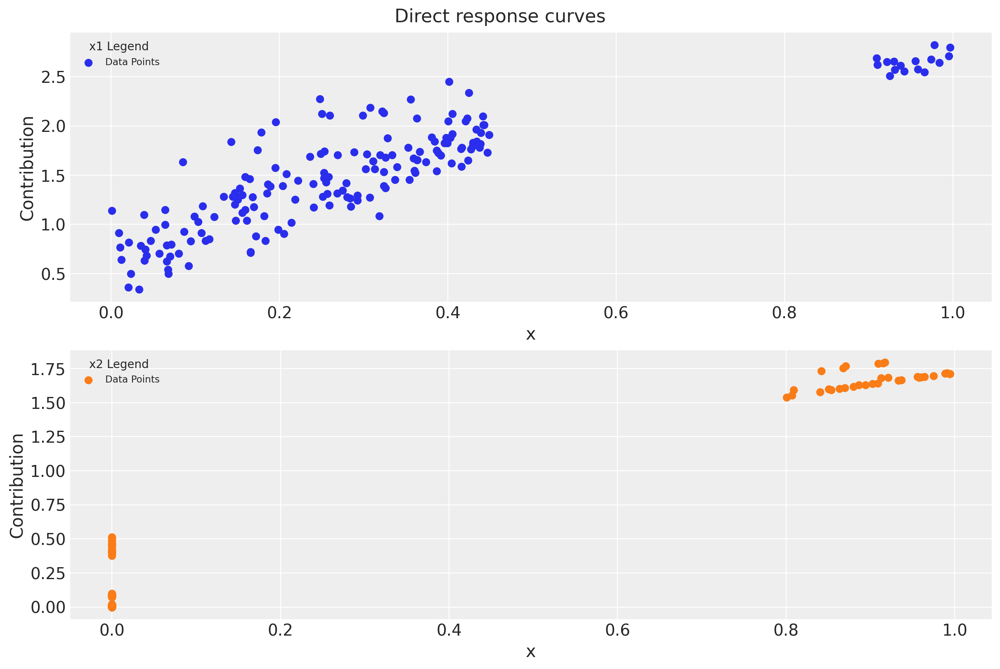

In [51]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="x") for ax in fig.axes];

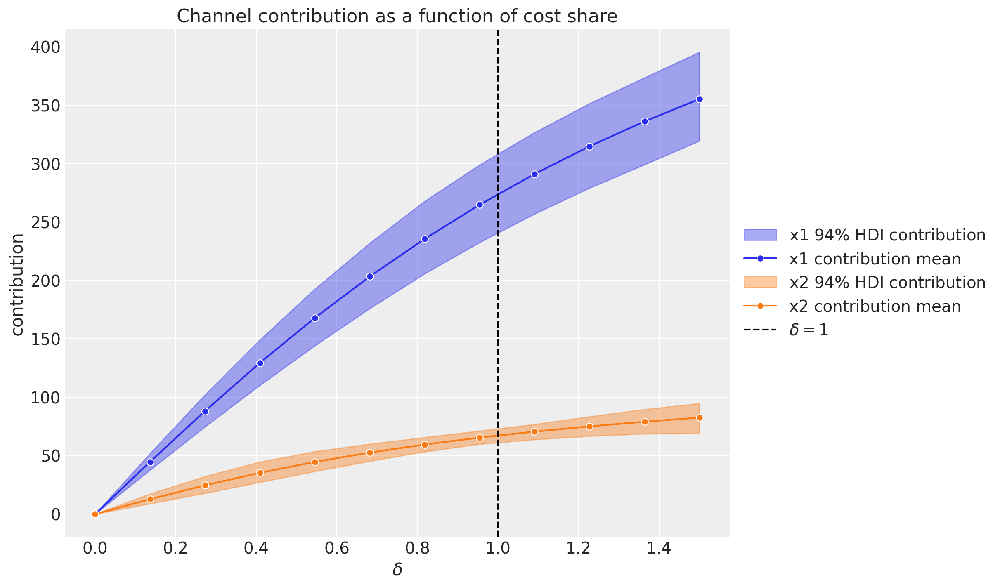

In [52]:
mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12);

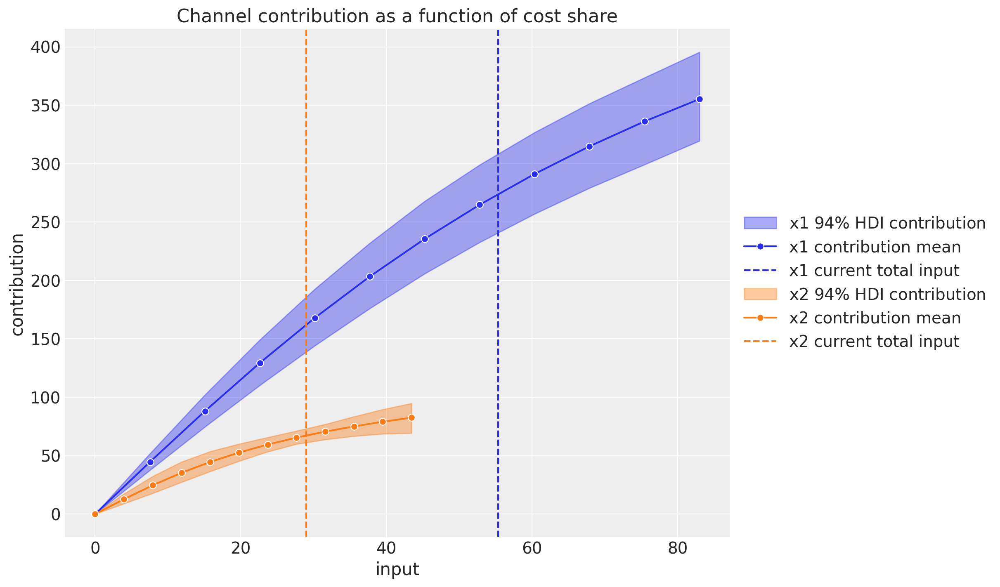

In [53]:
mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12, absolute_xrange=True);

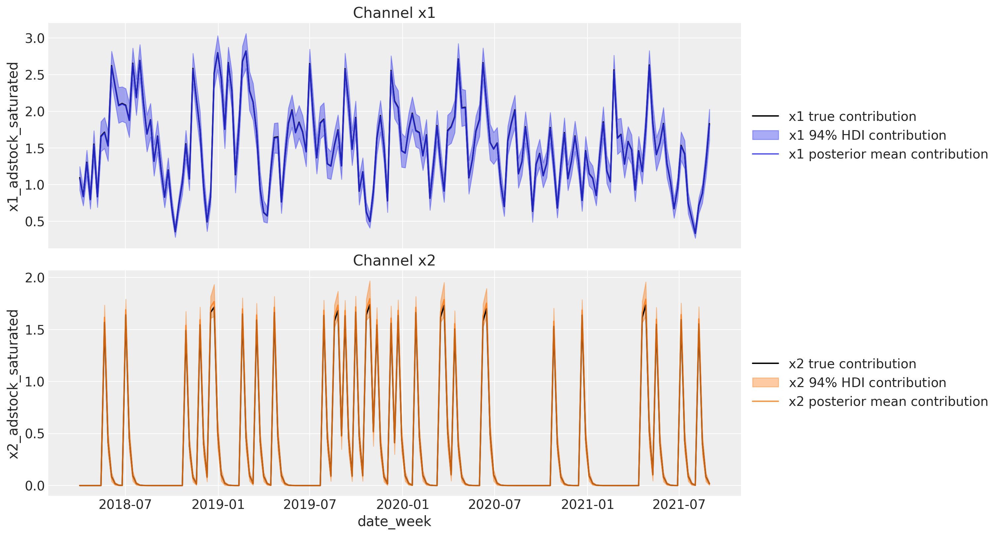

In [54]:
channels_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
channels_contribution_original_scale_hdi = az.hdi(
    ary=channels_contribution_original_scale
)

fig, ax = plt.subplots(
    nrows=2, figsize=(15, 8), ncols=1, sharex=True, sharey=False, layout="constrained"
)

for i, x in enumerate(["x1", "x2"]):
    # Estimate true contribution in the original scale from the data generating process
    sns.lineplot(
        x=df["date_week"],
        y=amplitude * betas[i] * df[f"{x}_adstock_saturated"],
        color="black",
        label=f"{x} true contribution",
        ax=ax[i],
    )
    # HDI estimated contribution in the original scale
    ax[i].fill_between(
        x=df["date_week"],
        y1=channels_contribution_original_scale_hdi.sel(channel=x)["x"][:, 0],
        y2=channels_contribution_original_scale_hdi.sel(channel=x)["x"][:, 1],
        color=f"C{i}",
        label=rf"{x} $94\%$ HDI contribution",
        alpha=0.4,
    )
    # Mean estimated contribution in the original scale
    sns.lineplot(
        x=df["date_week"],
        y=get_mean_contributions_over_time_df[x].to_numpy(),
        color=f"C{i}",
        label=f"{x} posterior mean contribution",
        alpha=0.8,
        ax=ax[i],
    )
    ax[i].legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax[i].set(title=f"Channel {x}")

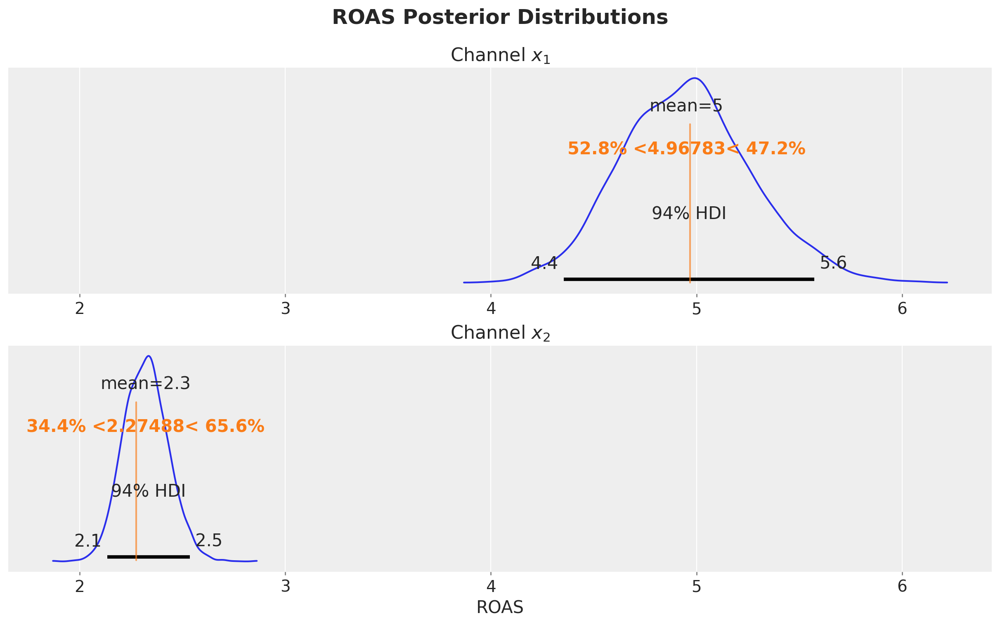

In [55]:
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
spend_sum = X[["x1", "x2"]].sum().to_numpy()

roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum[np.newaxis, np.newaxis, :]
)

fig, axes = plt.subplots(
    nrows=2, ncols=1, figsize=(12, 7), sharex=True, sharey=False, layout="constrained"
)
az.plot_posterior(roas_samples, ref_val=[roas_1, roas_2], ax=axes)
axes[0].set(title="Channel $x_{1}$")
axes[1].set(title="Channel $x_{2}$", xlabel="ROAS")
fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.06);

In [56]:
last_date = X["date_week"].max()

# New dates starting from last in dataset
n_new = 5
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

X_out_of_sample = pd.DataFrame(
    {
        "date_week": new_dates,
    }
)

# Same channel spends as last day
X_out_of_sample["x1"] = X["x1"].iloc[-1]
X_out_of_sample["x2"] = X["x2"].iloc[-1]

# Other features
X_out_of_sample["event_1"] = 0
X_out_of_sample["event_2"] = 0

X_out_of_sample["t"] = range(len(X), len(X) + n_new)

X_out_of_sample

,date_week,x1,x2,event_1,event_2,t
0,2021-09-06,0.438857,0.0,0,0,179
1,2021-09-13,0.438857,0.0,0,0,180
2,2021-09-20,0.438857,0.0,0,0,181
3,2021-09-27,0.438857,0.0,0,0,182
4,2021-10-04,0.438857,0.0,0,0,183


In [57]:
X_out_of_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_week  5 non-null      datetime64[ns]
 1   x1         5 non-null      float64       
 2   x2         5 non-null      float64       
 3   event_1    5 non-null      int64         
 4   event_2    5 non-null      int64         
 5   t          5 non-null      int64         
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 368.0 bytes


In [59]:
y_out_of_sample = mmm.sample_posterior_predictive(
    X_pred=X_out_of_sample, extend_idata=False
)

y_out_of_sample

Output()

<xarray.Dataset> Size: 256kB
Dimensions:  (sample: 4000, date: 5)
Coordinates:
  * date     (date) datetime64[ns] 40B 2021-09-06 2021-09-13 ... 2021-10-04
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 160kB 4.75 4.352 4.61 ... 5.375 6.081 6.223
Attributes:
    created_at:                 2024-10-29T06:50:31.886652+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

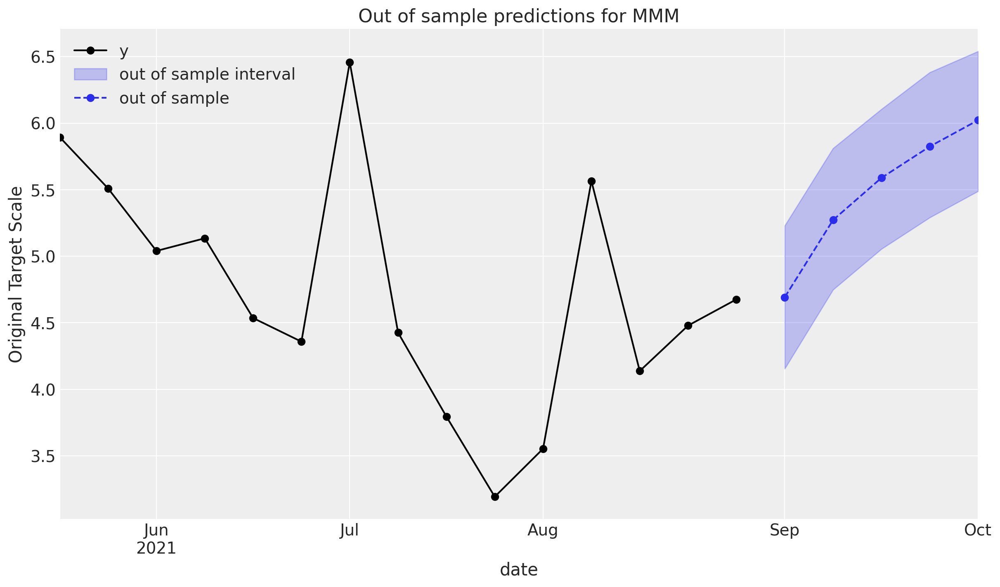

In [60]:
def plot_in_sample(X, y, ax, n_points: int = 15):
    (
        y.to_frame()
        .set_index(X["date_week"])
        .iloc[-n_points:]
        .plot(ax=ax, marker="o", color="black", label="actuals")
    )
    return ax


def plot_out_of_sample(X_out_of_sample, y_out_of_sample, ax, color, label):
    y_out_of_sample_groupby = y_out_of_sample["y"].to_series().groupby("date")

    lower, upper = quantiles = [0.025, 0.975]
    conf = y_out_of_sample_groupby.quantile(quantiles).unstack()
    ax.fill_between(
        X_out_of_sample["date_week"].dt.to_pydatetime(),
        conf[lower],
        conf[upper],
        alpha=0.25,
        color=color,
        label=f"{label} interval",
    )

    mean = y_out_of_sample_groupby.mean()
    mean.plot(ax=ax, marker="o", label=label, color=color, linestyle="--")
    ax.set(ylabel="Original Target Scale", title="Out of sample predictions for MMM")
    return ax


_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
ax.legend(loc="upper left");

In [61]:
y_out_of_sample_with_adstock = mmm.sample_posterior_predictive(
    X_pred=X_out_of_sample, extend_idata=False, include_last_observations=True
)

Output()

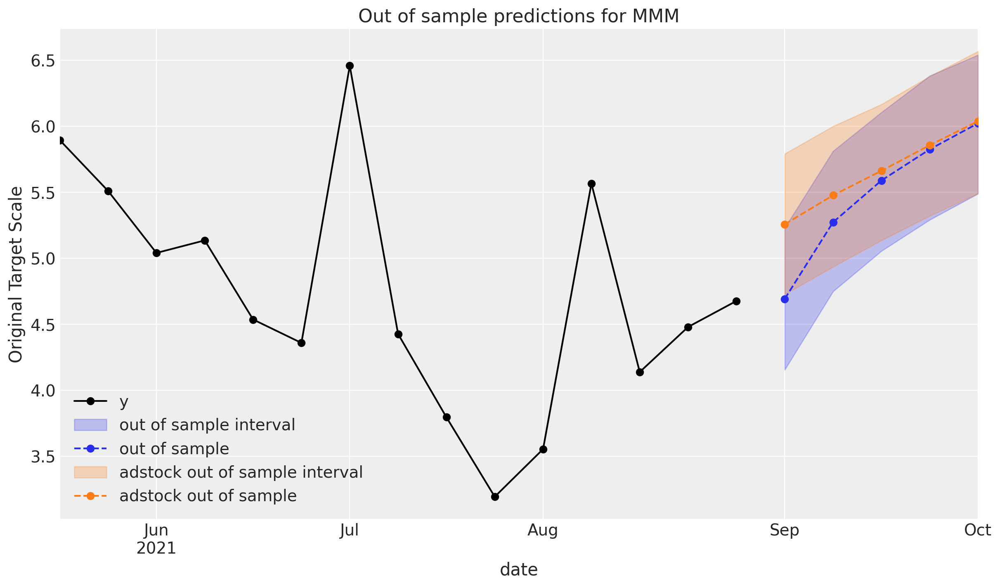

In [62]:
_, ax = plt.subplots()
plot_in_sample(X, y, ax=ax)
plot_out_of_sample(
    X_out_of_sample, y_out_of_sample, ax=ax, label="out of sample", color="C0"
)
plot_out_of_sample(
    X_out_of_sample,
    y_out_of_sample_with_adstock,
    ax=ax,
    label="adstock out of sample",
    color="C1",
)
ax.legend();

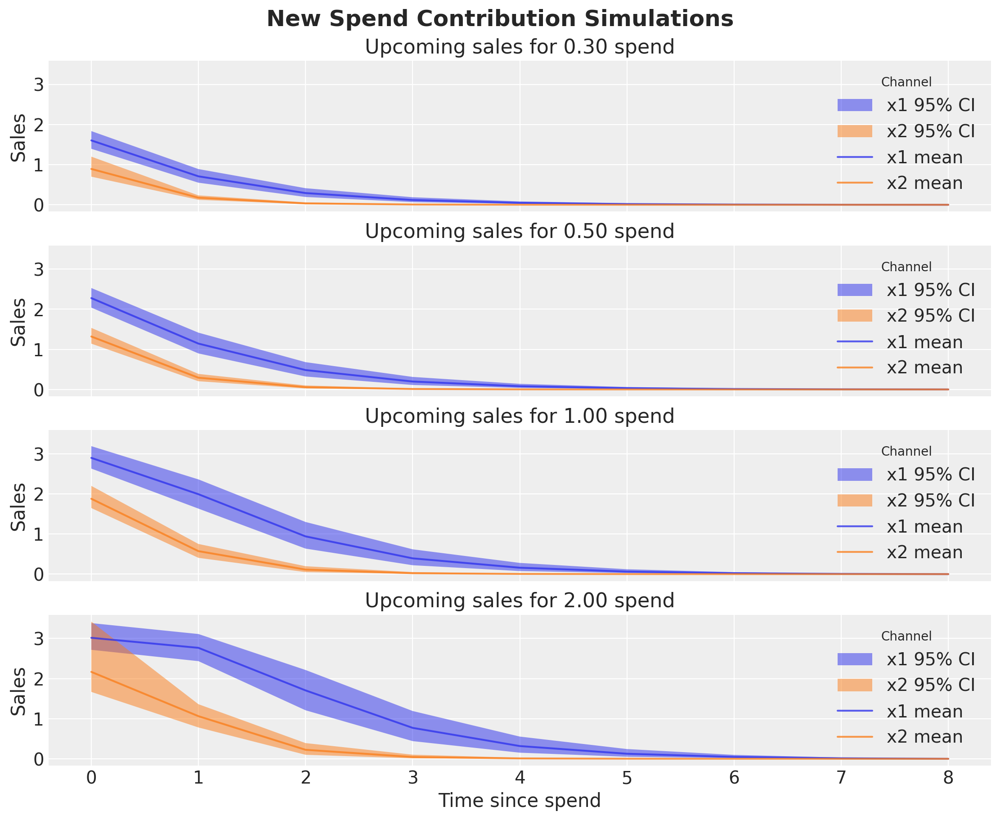

In [63]:
spends = [0.3, 0.5, 1, 2]

fig, axes = plt.subplots(
    nrows=len(spends),
    ncols=1,
    figsize=(11, 9),
    sharex=True,
    sharey=True,
    layout="constrained",
)

axes = axes.flatten()

for ax, spend in zip(axes, spends, strict=True):
    mmm.plot_new_spend_contributions(spend_amount=spend, progressbar=False, ax=ax)

fig.suptitle("New Spend Contribution Simulations", fontsize=18, fontweight="bold");

In [64]:
mmm.save("model.nc")

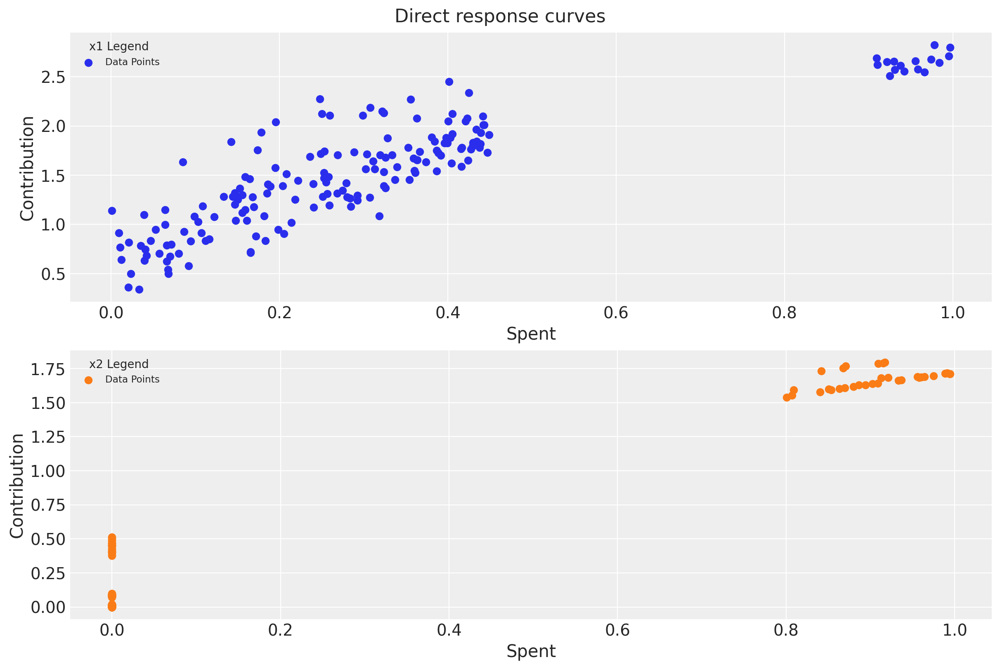

In [65]:
response_curve_fig = mmm.plot_direct_contribution_curves();

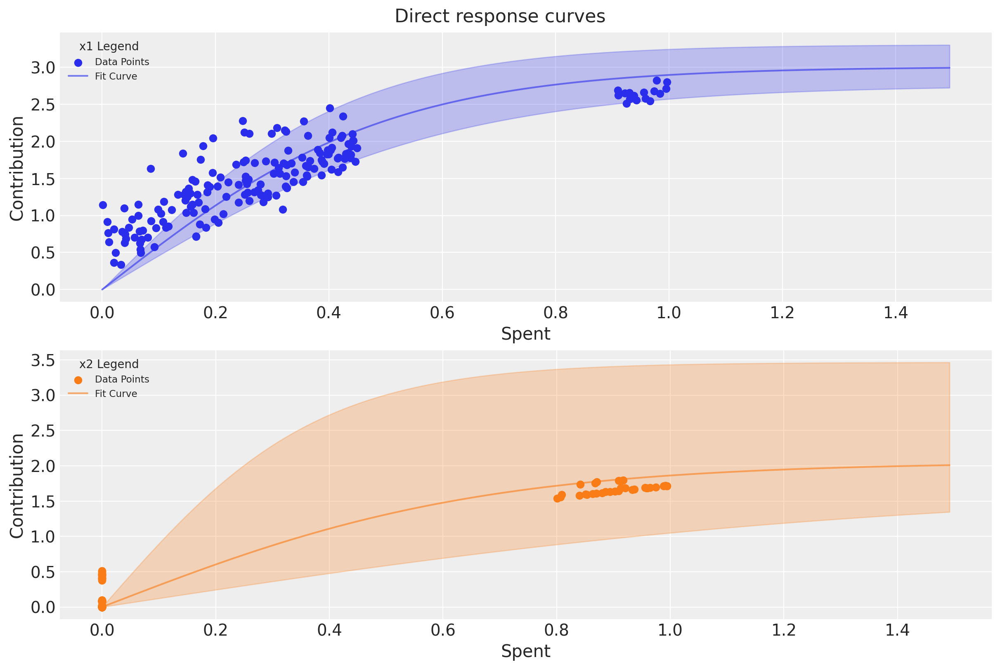

In [66]:
mmm.plot_direct_contribution_curves(show_fit=True, xlim_max=1.5);

In [67]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
saturation_beta[x1],0.363,0.020,0.327,0.402,0.000,0.000,1957.0,1871.0,1.0
saturation_beta[x2],0.271,0.087,0.192,0.399,0.003,0.002,1268.0,1091.0,1.0
saturation_lam[x1],3.958,0.390,3.212,4.675,0.008,0.006,2155.0,1803.0,1.0
saturation_lam[x2],3.133,1.196,0.997,5.291,0.032,0.023,1257.0,1092.0,1.0
adstock_alpha[x1],0.403,0.031,0.345,0.460,0.001,0.000,2648.0,2850.0,1.0
adstock_alpha[x2],0.187,0.041,0.108,0.258,0.001,0.001,2025.0,2007.0,1.0


In [68]:
total_budget = 5  # Imagine is 5K or 5M
# Define your channels
channels = ["x1", "x2"]
# The initial split per channel
budget_per_channel = total_budget / len(channels)
# Initial budget per channel as dictionary.
initial_budget_dict = {channel: budget_per_channel for channel in channels}
# bounds for each channel
min_budget, max_budget = 1, 5
budget_bounds = {channel: [min_budget, max_budget] for channel in channels}

In [69]:
response = mmm.allocate_budget_to_maximize_response(
    budget=total_budget,
    num_periods=8,
    time_granularity="weekly",
    budget_bounds=budget_bounds,
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


In [70]:
print(mmm.optimal_allocation_dict)

{'x1': 3.1602106681859974, 'x2': 1.8397893318140028}


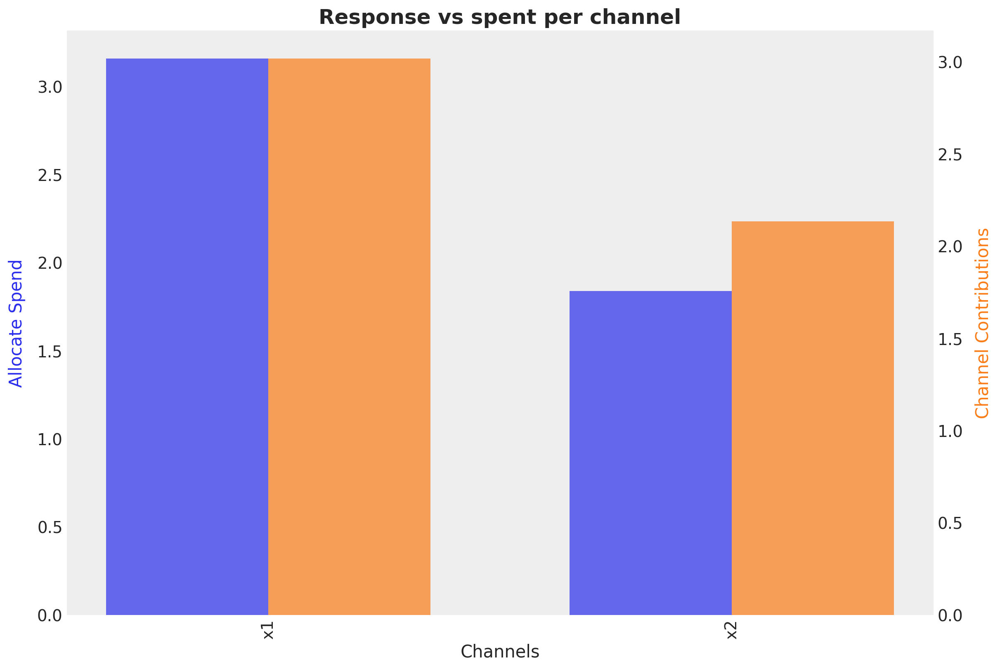

In [71]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
ax.set_title("Response vs spent per channel", fontsize=18, fontweight="bold");

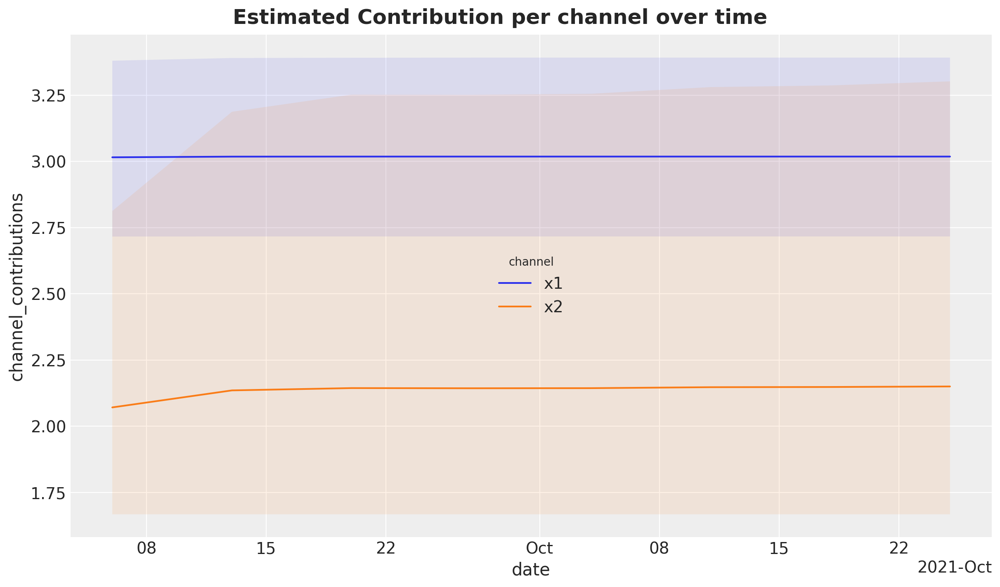

In [72]:
fig = mmm.plot_allocated_contribution_by_channel(samples=response)
fig.suptitle(
    "Estimated Contribution per channel over time", fontsize=18, fontweight="bold"
);

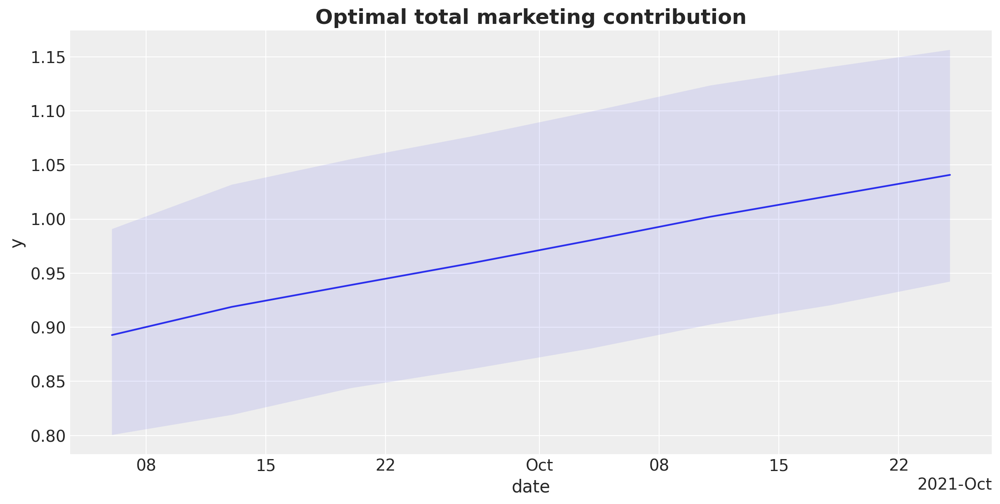

In [73]:
fig, ax = plt.subplots(figsize=(12, 6))

response["y"].mean(dim="sample").plot(ax=ax)
ax.fill_between(
    x=response.y.date.values,
    y1=response.y.quantile(0.025, dim="sample"),
    y2=response.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)
ax.set_title("Optimal total marketing contribution", fontsize=18, fontweight="bold");

In [74]:
last_date = mmm.X["date_week"].max()

# New dates starting from last in dataset
n_new = 8
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

initial_budget_scenario = pd.DataFrame(
    {
        "date_week": new_dates,
    }
)

# Same channel spends as last day
initial_budget_scenario["x1"] = initial_budget_dict["x1"]
initial_budget_scenario["x2"] = initial_budget_dict["x2"]

# Other features
initial_budget_scenario["event_1"] = 0
initial_budget_scenario["event_2"] = 0

initial_budget_scenario["t"] = 0

response_initial_budget = mmm.sample_posterior_predictive(
    X_pred=initial_budget_scenario, extend_idata=False
)

response_initial_budget

Output()

<xarray.Dataset> Size: 352kB
Dimensions:  (sample: 4000, date: 8)
Coordinates:
  * date     (date) datetime64[ns] 64B 2021-09-06 2021-09-13 ... 2021-10-25
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 256kB 7.045 7.533 7.473 ... 8.153 8.723
Attributes:
    created_at:                 2024-10-29T07:00:32.159843+00:00
    arviz_version:              0.19.0
    inference_library:          pymc
    inference_library_version:  5.15.1

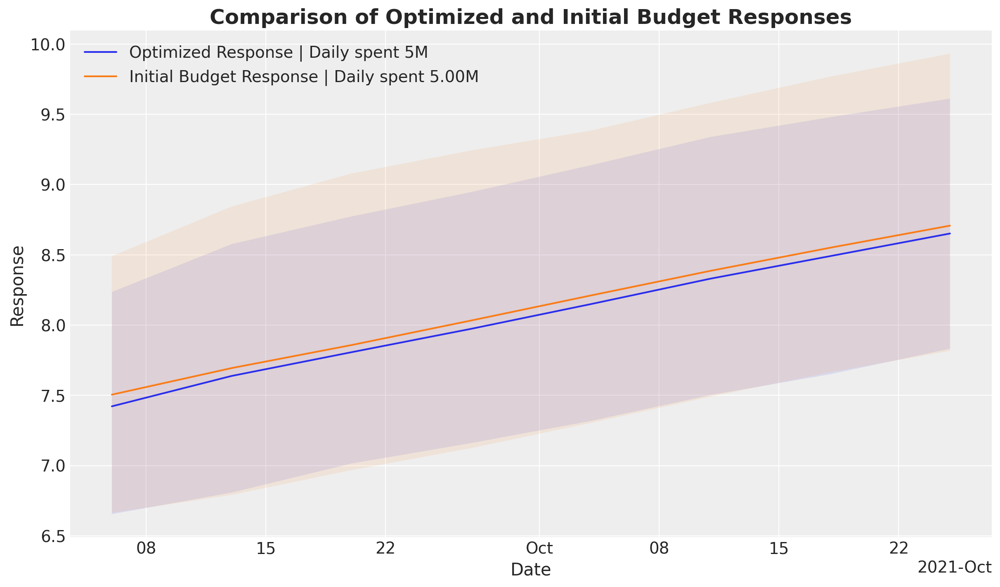

In [75]:
y_response_original_scale_optimize = (
    response["y"] * mmm.get_target_transformer()["scaler"].scale_
)

# Plotting optimized response
y_response_original_scale_optimize.mean(dim="sample").plot(
    label=f"Optimized Response | Daily spent {sum(mmm.optimal_allocation_dict.values()):.0f}M"
)
plt.fill_between(
    x=y_response_original_scale_optimize.date.values,
    y1=y_response_original_scale_optimize.quantile(0.025, dim="sample"),
    y2=y_response_original_scale_optimize.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Plotting initial budget response
response_initial_budget["y"].mean(dim="sample").plot(
    label="Initial Budget Response | Daily spent 5.00M"
)
plt.fill_between(
    x=response_initial_budget.y.date.values,
    y1=response_initial_budget.y.quantile(0.025, dim="sample"),
    y2=response_initial_budget.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Adding labels, legend, and title
plt.xlabel("Date")
plt.ylabel("Response")
plt.legend()
plt.title(
    "Comparison of Optimized and Initial Budget Responses",
    fontsize=18,
    fontweight="bold",
);

In [76]:
# Initialize two variables to save the results and base conditions for each scenario.
scenarios_result = []
scenarios = np.array([0.6, 0.8, 1.2, 1.8])
for scenario in scenarios:
    tmp_response = mmm.allocate_budget_to_maximize_response(
        budget=total_budget * scenario,
        num_periods=8,
        time_granularity="weekly",
        budget_bounds=budget_bounds,
    )
    scenarios_result.append(tmp_response)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


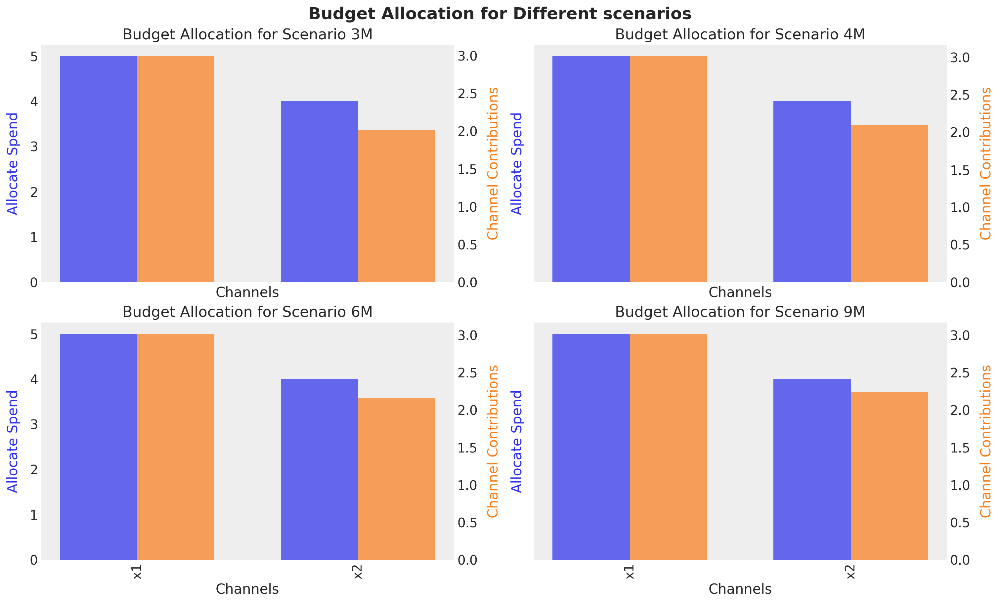

In [77]:
fig, axes = plt.subplots(
    nrows=2, ncols=2, figsize=(15, 9), sharex=True, sharey=True, layout="constrained"
)
for i, scenario in enumerate(scenarios_result):
    row = i // 2
    col = i % 2
    _, ax = mmm.plot_budget_allocation(samples=scenario, ax=axes[row, col])
    ax.set_title(f"Budget Allocation for Scenario {scenarios[i] * total_budget:.0f}M")

fig.suptitle(
    "Budget Allocation for Different scenarios", fontsize=18, fontweight="bold"
);

In [78]:
constrained_response = mmm.allocate_budget_to_maximize_response(
    budget=total_budget,
    num_periods=8,
    time_granularity="weekly",
    budget_bounds={"x1": [0, 4], "x2": [0, 3]},
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


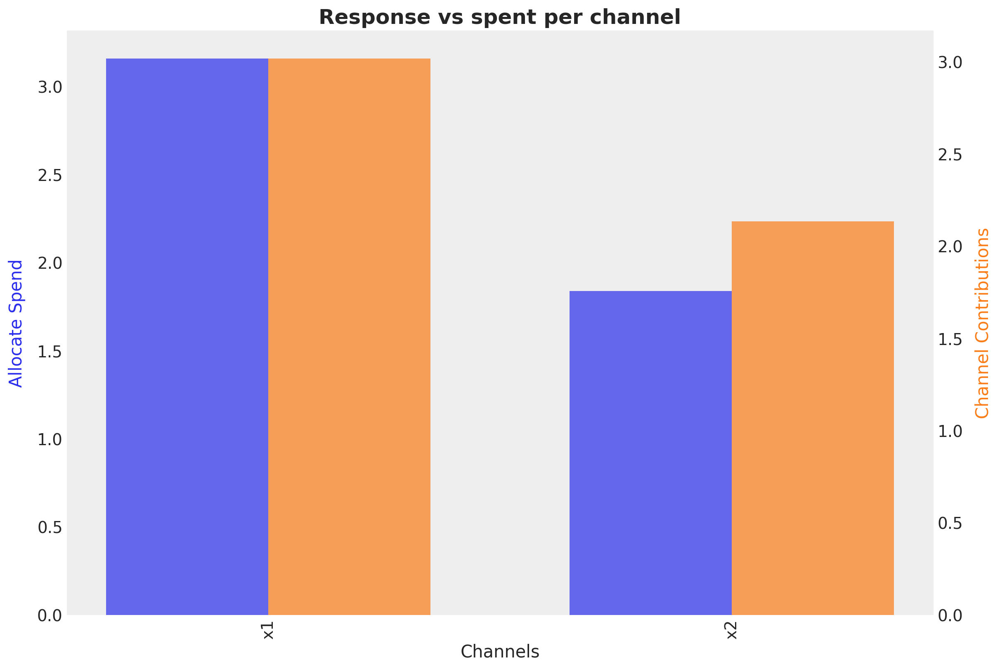

In [79]:
fig, ax = mmm.plot_budget_allocation(samples=constrained_response, figsize=(12, 8))
ax.set_title("Response vs spent per channel", fontsize=18, fontweight="bold");

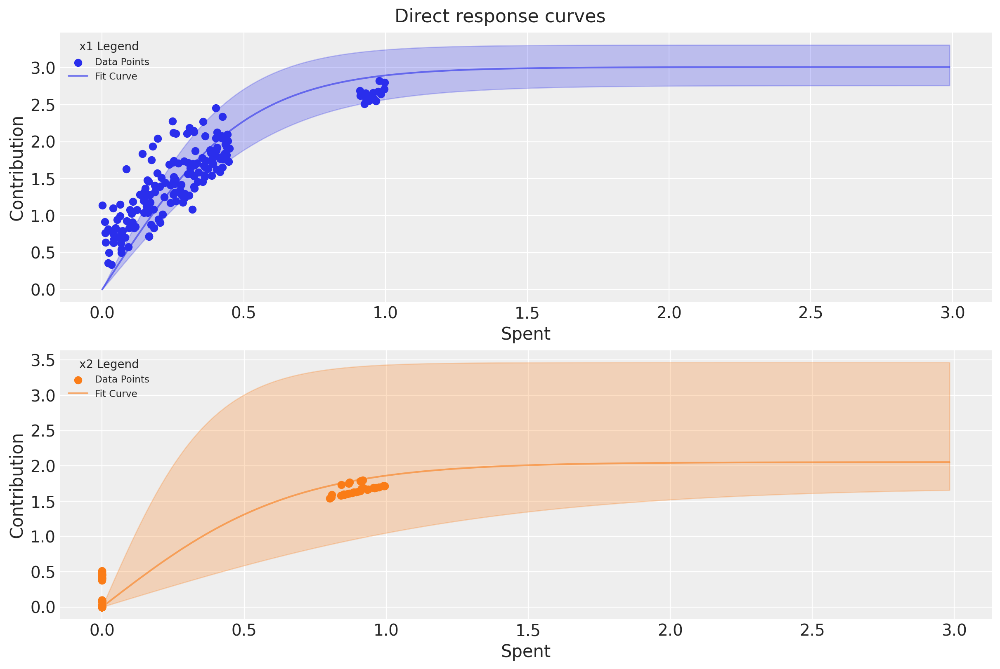

In [80]:
sigmoid_response_curve_fig = mmm.plot_direct_contribution_curves(
    show_fit=True, xlim_max=3
);

In [81]:
limit_constrained_response = mmm.allocate_budget_to_maximize_response(
    budget=2,
    num_periods=8,
    time_granularity="weekly",
    budget_bounds={"x1": [0, 1.2], "x2": [0, 1.5]},
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


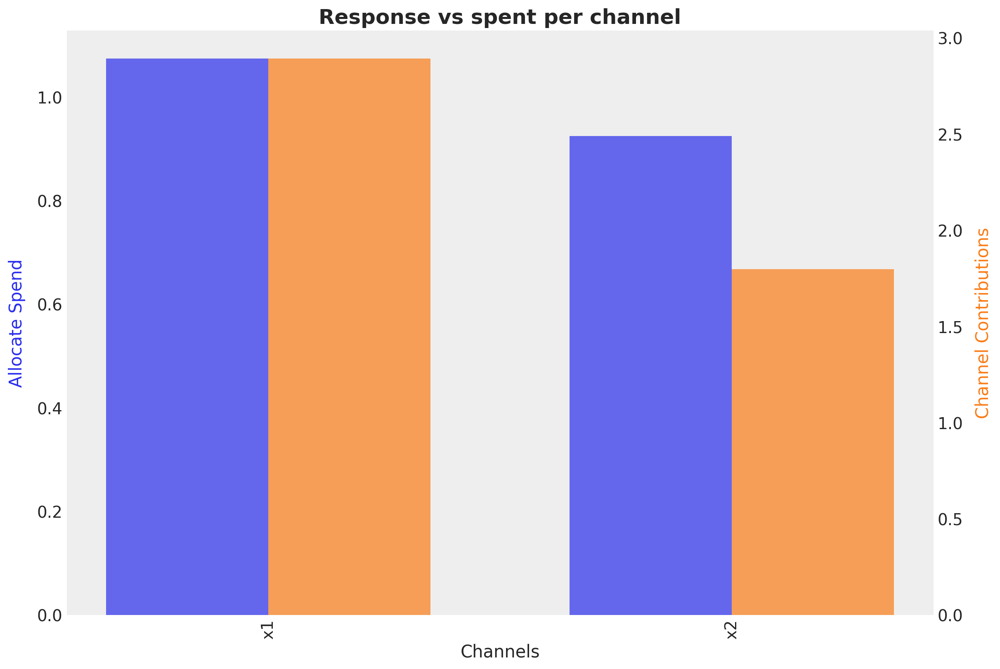

In [82]:
fig, ax = mmm.plot_budget_allocation(
    samples=limit_constrained_response, figsize=(12, 8)
)
ax.set_title("Response vs spent per channel", fontsize=18, fontweight="bold");

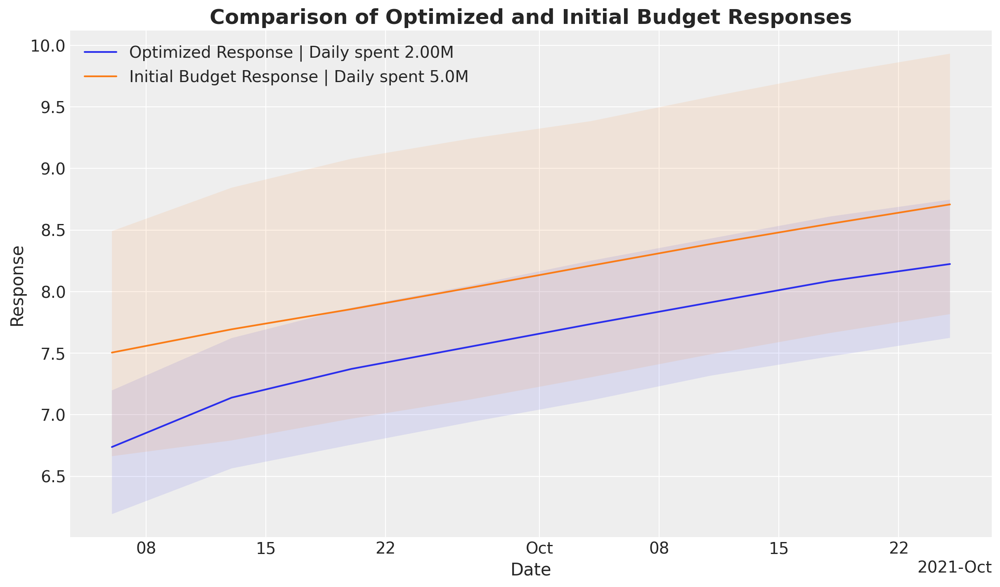

In [83]:
y_response_original_scale_optimize = (
    limit_constrained_response["y"] * mmm.get_target_transformer()["scaler"].scale_
)

# Plotting optimized response
y_response_original_scale_optimize.mean(dim="sample").plot(
    label=f"Optimized Response | Daily spent {sum(mmm.optimal_allocation_dict.values()):.2f}M"
)
plt.fill_between(
    x=y_response_original_scale_optimize.date.values,
    y1=y_response_original_scale_optimize.quantile(0.025, dim="sample"),
    y2=y_response_original_scale_optimize.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Plotting initial budget response
response_initial_budget["y"].mean(dim="sample").plot(
    label=f"Initial Budget Response | Daily spent {5.00}M"
)
plt.fill_between(
    x=response_initial_budget.y.date.values,
    y1=response_initial_budget.y.quantile(0.025, dim="sample"),
    y2=response_initial_budget.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Adding labels, legend, and title
plt.xlabel("Date")
plt.ylabel("Response")
plt.legend()
plt.title(
    "Comparison of Optimized and Initial Budget Responses",
    fontsize=18,
    fontweight="bold",
);

In [84]:
limit_constrained_response_with_noise = mmm.allocate_budget_to_maximize_response(
    budget=2,
    num_periods=8,
    time_granularity="weekly",
    budget_bounds={"x1": [0, 1.2], "x2": [0, 1.5]},
    noise_level=0.1,  # New parameter
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


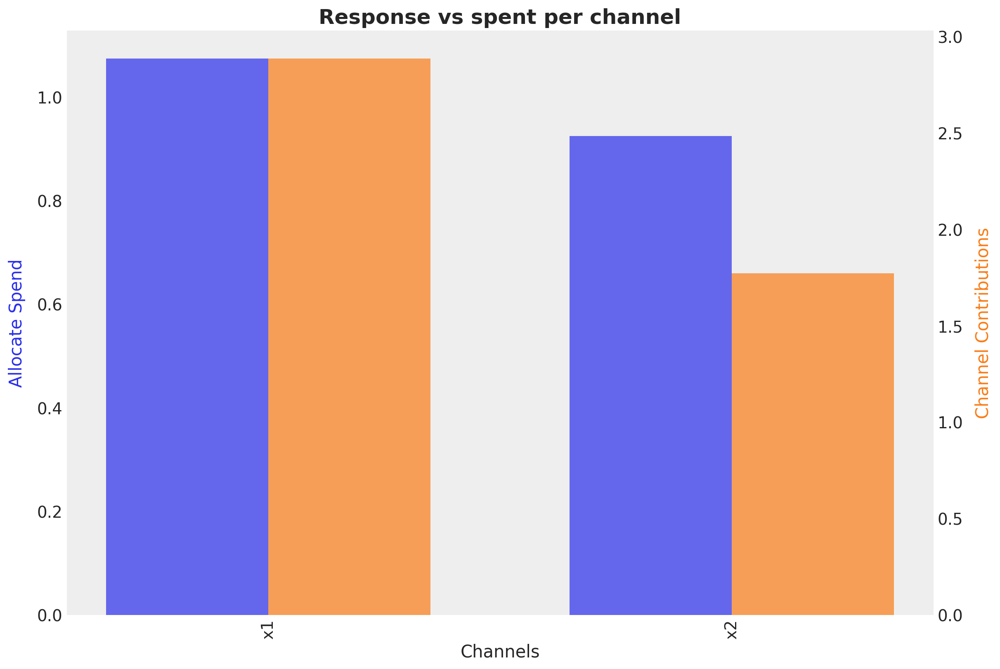

In [85]:
fig, ax = mmm.plot_budget_allocation(
    samples=limit_constrained_response_with_noise, figsize=(12, 8)
)
ax.set_title("Response vs spent per channel", fontsize=18, fontweight="bold");

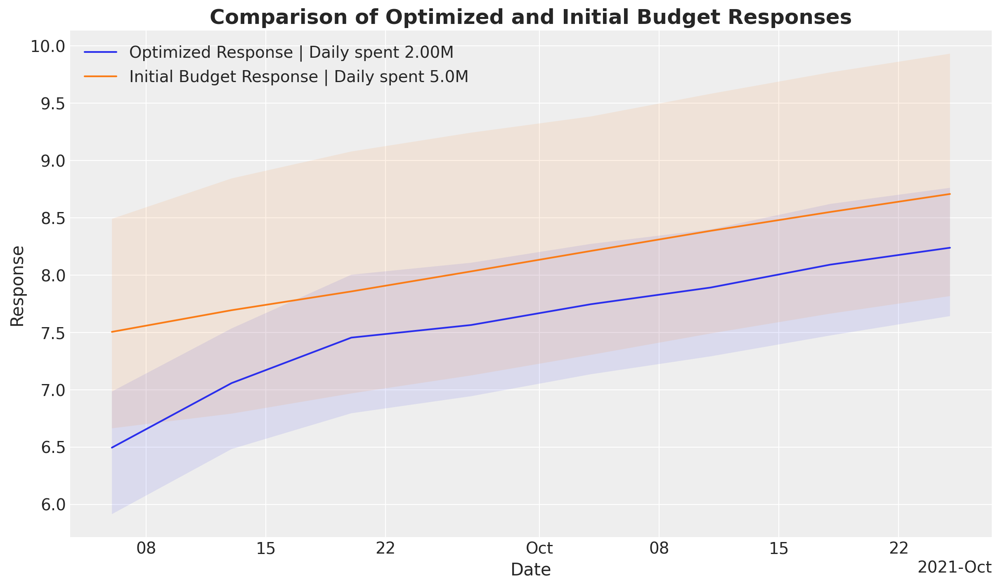

In [86]:
y_response_original_scale_optimize = (
    limit_constrained_response_with_noise["y"]
    * mmm.get_target_transformer()["scaler"].scale_
)

# Plotting optimized response
y_response_original_scale_optimize.mean(dim="sample").plot(
    label=f"Optimized Response | Daily spent {sum(mmm.optimal_allocation_dict.values()):.2f}M"
)
plt.fill_between(
    x=y_response_original_scale_optimize.date.values,
    y1=y_response_original_scale_optimize.quantile(0.025, dim="sample"),
    y2=y_response_original_scale_optimize.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Plotting initial budget response
response_initial_budget["y"].mean(dim="sample").plot(
    label=f"Initial Budget Response | Daily spent {5.00}M"
)
plt.fill_between(
    x=response_initial_budget.y.date.values,
    y1=response_initial_budget.y.quantile(0.025, dim="sample"),
    y2=response_initial_budget.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)

# Adding labels, legend, and title
plt.xlabel("Date")
plt.ylabel("Response")
plt.legend()
plt.title(
    "Comparison of Optimized and Initial Budget Responses",
    fontsize=18,
    fontweight="bold",
);